In [1]:
%load_ext nb_black

<IPython.core.display.Javascript object>

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

from scipy.stats import pearsonr
from collections import Counter

<IPython.core.display.Javascript object>

# Exploratory Data Analyses - EDA - 204 data

### Reading the files and extracting relevant information:

In [3]:
plants = ["A", "AB", "AE", "AQ", "AY", "F", "I", "O", "R", "T"]
xls_files = {}

for plant in plants:
    xls = pd.ExcelFile(
        f"../../../data/raw/204/EMBRAPII hubIC IACC CIMENTO_{plant}.xlsx",
        engine="openpyxl",
    )
    xls_files[plant] = xls

<IPython.core.display.Javascript object>

In [4]:
for plant, xls in xls_files.items():
    print("Palnt: ", plant, xls.sheet_names)

Palnt:  A ['INSTRUÇÕES', '176', '102']
Palnt:  AB ['INSTRUÇÕES', '13', '51', '173']
Palnt:  AE ['INSTRUÇÕES', '181', '109', '23']
Palnt:  AQ ['INSTRUÇÕES', 'Fibro', '7', '153', '89']
Palnt:  AY ['INSTRUÇÕES', '12']
Palnt:  F ['INSTRUÇÕES', '55', '75', '14', '91', '65']
Palnt:  I ['INSTRUÇÕES', '47', '11', '1']
Palnt:  O ['INSTRUÇÕES', '132', '81', 'FIBRO']
Palnt:  R ['INSTRUÇÕES', '21', '61']
Palnt:  T ['INSTRUÇÕES', '72', '104']


<IPython.core.display.Javascript object>

In [5]:
cement_types_per_plant = []
CEMENT_TYPE_COLS = ["Tipo de cimento", "Classe de resistência"]
dataframes = []

for plant, xls in xls_files.items():
    for sheet_name in xls.sheet_names[1:]:
        df = pd.read_excel(xls_files[plant], sheet_name, header=[1, 2])
        if not df[CEMENT_TYPE_COLS].iloc[2:].isna().all().all():
            cement_type = (
                df[CEMENT_TYPE_COLS]
                .loc[2:]
                .astype(str)
                .sum(axis=1)
                .str.replace(" ", "")
                .str.replace("-", "")
                .str.replace("nan", "")
                .unique()
            )

        else:
            cement_type = (
                df[[("Obs.", "Unnamed: 8_level_1")]]
                .loc[2:]
                .astype(str)
                .sum(axis=1)
                .str.replace(" ", "")
                .str.replace("-", "")
                .unique()
            )

        cement_types_per_plant.append((plant, sheet_name, cement_type))
        dataframes.append(df)

<IPython.core.display.Javascript object>

In [6]:
cement_types_per_plant

[('A', '176', array(['', 'CPVARIRS'], dtype=object)),
 ('A', '102', array(['', 'CPIV32'], dtype=object)),
 ('AB', '13', array(['CPIIF32'], dtype=object)),
 ('AB', '51', array(['', 'CPVARI'], dtype=object)),
 ('AB', '173', array(['', 'CPIIF40'], dtype=object)),
 ('AE', '181', array(['', 'CPVARI'], dtype=object)),
 ('AE', '109', array(['', 'CPIIF32'], dtype=object)),
 ('AE', '23', array(['', 'CPIV32RS'], dtype=object)),
 ('AQ', 'Fibro', array(['', 'Fibro'], dtype=object)),
 ('AQ', '7', array(['', 'CPIIF40'], dtype=object)),
 ('AQ', '153', array(['', 'CPIIF32'], dtype=object)),
 ('AQ', '89', array(['', 'CPVARI'], dtype=object)),
 ('AY', '12', array(['', 'CPIII40RS'], dtype=object)),
 ('F', '55', array(['CPVARI'], dtype=object)),
 ('F', '75', array(['CPIIE32'], dtype=object)),
 ('F', '14', array(['CPIIF32', ''], dtype=object)),
 ('F', '91', array(['CPIV32'], dtype=object)),
 ('F', '65', array(['CPVARIRS'], dtype=object)),
 ('I', '47', array(['CPIV32', ''], dtype=object)),
 ('I', '11', arra

<IPython.core.display.Javascript object>

In [7]:
cements = []
for tup in cement_types_per_plant:
    cements.append(tup[2][0])
Counter(cements)

Counter({'': 21,
         'CPIIF32': 2,
         'CPIV32': 2,
         'CPVARI': 1,
         'CPIIE32': 1,
         'CPVARIRS': 1})

<IPython.core.display.Javascript object>

In [8]:
dataframes = []

for plant, xls in xls_files.items():
    for sheet_name in xls.sheet_names[1:]:
        df = pd.read_excel(xls_files[plant], sheet_name, header=[0, 1, 2])
        df["Unnamed: 0_level_0", "Unnamed: 0_level_1", "Unnamed: 0_level_2"] = plant
        dataframes.append(df.drop([0, 1], axis=0).reset_index(drop=True).copy())

<IPython.core.display.Javascript object>

In [9]:
df = pd.concat(dataframes, axis=0).reset_index(drop=True)

<IPython.core.display.Javascript object>

In [10]:
df["Dados iniciais"].infer_objects().info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16186 entries, 0 to 16185
Data columns (total 8 columns):
 #   Column                                       Non-Null Count  Dtype         
---  ------                                       --------------  -----         
 0   (Cidade, Unnamed: 1_level_2)                 16000 non-null  object        
 1   (Data, Produção)                             16000 non-null  datetime64[ns]
 2   (Horário, Produção)                          0 non-null      float64       
 3   (Data, Medida)                               0 non-null      float64       
 4   (Horário, Medida)                            0 non-null      float64       
 5   (Tipo de cimento, Unnamed: 6_level_2)        16000 non-null  object        
 6   (Classe de resistência, Unnamed: 7_level_2)  0 non-null      float64       
 7   (Obs., Unnamed: 8_level_2)                   0 non-null      float64       
dtypes: datetime64[ns](1), float64(5), object(2)
memory usage: 1011.8+ KB


<IPython.core.display.Javascript object>

In [11]:
df["Materiais cimentícios suplementares"].infer_objects().info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16186 entries, 0 to 16185
Data columns (total 59 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   (Fíler calcário, CaO)              0 non-null      float64
 1   (Fíler calcário, SO2)              0 non-null      float64
 2   (Fíler calcário, K2O)              0 non-null      float64
 3   (Fíler calcário, MgO)              0 non-null      float64
 4   (Fíler calcário, Na2O)             0 non-null      float64
 5   (Fíler calcário, SiO2)             0 non-null      float64
 6   (Fíler calcário, Al2O3)            0 non-null      float64
 7   (Fíler calcário, Fe2O3)            0 non-null      float64
 8   (Fíler calcário, Perda ao fogo)    0 non-null      float64
 9   (Fíler calcário, Calcita)          0 non-null      float64
 10  (Fíler calcário, Dolomita)         0 non-null      float64
 11  (Fíler calcário, Quartzo)          0 non-null      flo

<IPython.core.display.Javascript object>

In [12]:
df["Cimento"]["Composição"].infer_objects().info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16186 entries, 0 to 16185
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Clínquer           0 non-null      float64
 1   Fíler calcário     0 non-null      float64
 2   Cinza volante      0 non-null      float64
 3   Escória            0 non-null      float64
 4   Argila calcinada   0 non-null      float64
 5   Sulfato de cálcio  0 non-null      float64
 6   Obs.               0 non-null      float64
dtypes: float64(7)
memory usage: 885.3 KB


<IPython.core.display.Javascript object>

In [13]:
df["Cimento"]["Análise química"].infer_objects().info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16186 entries, 0 to 16185
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   CaO                13098 non-null  float64
 1   MgO                14942 non-null  float64
 2   Na2O               13218 non-null  float64
 3   Al2O3              13093 non-null  float64
 4   SiO2               13102 non-null  float64
 5   SO3                15949 non-null  object 
 6   K2O                14932 non-null  float64
 7   TiO2               0 non-null      float64
 8   Fe2O3              13100 non-null  float64
 9   Perda ao fogo      15965 non-null  object 
 10  Resíduo insolúvel  6503 non-null   float64
 11  Obs.               6174 non-null   float64
dtypes: float64(10), object(2)
memory usage: 1.5+ MB


<IPython.core.display.Javascript object>

In [14]:
df["Cimento"]["Análise mineralógica"].infer_objects().info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16186 entries, 0 to 16185
Data columns (total 23 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   C3S total          0 non-null      float64
 1   C2S total          0 non-null      float64
 2   C2S alpha          0 non-null      float64
 3   C2S beta           0 non-null      float64
 4   C2S gama           0 non-null      float64
 5   C4AF               0 non-null      float64
 6   C3A                0 non-null      float64
 7   C3A cubic          0 non-null      float64
 8   C3A orto           0 non-null      float64
 9   CaO livre          0 non-null      float64
 10  Portlandita        0 non-null      float64
 11  Periclasio         0 non-null      float64
 12  Arcanita           0 non-null      float64
 13  Aphthalita         0 non-null      float64
 14  Langbeinita        0 non-null      float64
 15  Sulfato de cálcio  0 non-null      float64
 16  Bassanita          0 n

<IPython.core.display.Javascript object>

In [15]:
df["Cimento"].columns

MultiIndex([(          'Composição',          'Clínquer'),
            (          'Composição',    'Fíler calcário'),
            (          'Composição',     'Cinza volante'),
            (          'Composição',           'Escória'),
            (          'Composição',  'Argila calcinada'),
            (          'Composição', 'Sulfato de cálcio'),
            (          'Composição',              'Obs.'),
            (     'Análise química',               'CaO'),
            (     'Análise química',               'MgO'),
            (     'Análise química',              'Na2O'),
            (     'Análise química',             'Al2O3'),
            (     'Análise química',              'SiO2'),
            (     'Análise química',               'SO3'),
            (     'Análise química',               'K2O'),
            (     'Análise química',              'TiO2'),
            (     'Análise química',             'Fe2O3'),
            (     'Análise química',     'Perda ao fogo'

<IPython.core.display.Javascript object>

In [16]:
df["Característias físicas do cimento"].infer_objects().info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16186 entries, 0 to 16185
Data columns (total 6 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   (Unnamed: 136_level_1, Blaine)            15990 non-null  float64
 1   (Unnamed: 137_level_1, #200)              15588 non-null  float64
 2   (Unnamed: 138_level_1, #325)              15995 non-null  float64
 3   (Unnamed: 139_level_1, #400)              0 non-null      float64
 4   (Unnamed: 140_level_1, Massa específica)  0 non-null      float64
 5   (Unnamed: 141_level_1, Obs.)              0 non-null      float64
dtypes: float64(6)
memory usage: 758.8 KB


<IPython.core.display.Javascript object>

In [17]:
df["Propriedades do cimento"].infer_objects().info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16186 entries, 0 to 16185
Data columns (total 7 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   (Tempo de pega, Inicio)           15989 non-null  object 
 1   (Tempo de pega, Fim)              15869 non-null  float64
 2   (Resistência à compressão, 1 d)   10175 non-null  float64
 3   (Resistência à compressão, 3 d)   15969 non-null  float64
 4   (Resistência à compressão, 7 d)   15941 non-null  object 
 5   (Resistência à compressão, 28 d)  15752 non-null  float64
 6   (Obs., Unnamed: 148_level_2)      0 non-null      float64
dtypes: float64(5), object(2)
memory usage: 885.3+ KB


<IPython.core.display.Javascript object>

In [18]:
def convert_to_float(value):
    try:
        # If it's a string enclosed in single quotes, remove quotes and replace comma with dot
        if isinstance(value, str):
            return float(value.replace(",", "."))
        else:
            return float(value)
    except ValueError as e:
        print(e)
        return float("nan")

<IPython.core.display.Javascript object>

In [19]:
df = pd.concat(
    [
        df["Unnamed: 0_level_0", "Unnamed: 0_level_1", "Unnamed: 0_level_2"],
        df["Dados iniciais"],
        df["Cimento"]["Análise química"],
        df["Característias físicas do cimento"],
        df["Propriedades do cimento"],
    ],
    axis=1,
)

<IPython.core.display.Javascript object>

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16186 entries, 0 to 16185
Data columns (total 34 columns):
 #   Column                                                        Non-Null Count  Dtype  
---  ------                                                        --------------  -----  
 0   (Unnamed: 0_level_0, Unnamed: 0_level_1, Unnamed: 0_level_2)  16186 non-null  object 
 1   (Cidade, Unnamed: 1_level_2)                                  16000 non-null  object 
 2   (Data, Produção)                                              16000 non-null  object 
 3   (Horário, Produção)                                           0 non-null      object 
 4   (Data, Medida)                                                0 non-null      object 
 5   (Horário, Medida)                                             0 non-null      object 
 6   (Tipo de cimento, Unnamed: 6_level_2)                         16000 non-null  object 
 7   (Classe de resistência, Unnamed: 7_level_2)                   0 non

<IPython.core.display.Javascript object>

In [21]:
COLUMNS_TO_DROP = [
    ("Data", "Medida"),
    ("Horário", "Produção"),
    ("Horário", "Medida"),
    ("Obs.", "Unnamed: 148_level_2"),
    ("Tipo de cimento", "Unnamed: 6_level_2"),
    ("Classe de resistência", "Unnamed: 7_level_2"),
    ("Obs.", "Unnamed: 8_level_2"),
    "Obs.",
    ("Obs.", "Unnamed: 148_level_2"),
    ("Unnamed: 141_level_1", "Obs."),
]

COLUMNS_TO_RENAME = {
    ("Unnamed: 0_level_0", "Unnamed: 0_level_1", "Unnamed: 0_level_2"): "Plant",
    ("Cidade", "Unnamed: 1_level_2"): "City",
    ("Data", "Produção"): "Date",  # Arrumar!
    ("Unnamed: 136_level_1", "Blaine"): "Blaine",
    ("Unnamed: 137_level_1", "#200"): "#200",
    ("Unnamed: 138_level_1", "#325"): "#325",
    ("Unnamed: 139_level_1", "#400"): "#400",
    ("Unnamed: 140_level_1", "Massa específica"): "Specific Gravity",
    ("Tempo de pega", "Inicio"): "Final setting time",
    ("Tempo de pega", "Fim"): "Initial setting time",
    ("Resistência à compressão", "1 d"): "CS1",
    ("Resistência à compressão", "3 d"): "CS3",
    ("Resistência à compressão", "7 d"): "CS7",
    ("Resistência à compressão", "28 d"): "CS28",
    "Perda ao fogo": "Loss on Ignition",
    "Resíduo insolúvel": "Insoluble Residue",
}

# Single variable for the Cement Type
df["Cement_Type"] = (
    df[
        [
            ("Tipo de cimento", "Unnamed: 6_level_2"),
            ("Classe de resistência", "Unnamed: 7_level_2"),
            ("Obs.", "Unnamed: 8_level_2"),
        ]
    ]
    .fillna("")
    .astype(str)
    .sum(axis=1)
)

# # Preprocessing
df["Cement_Type"] = df["Cement_Type"].replace("Fibro", "Fibrocimento")


df = df.drop(COLUMNS_TO_DROP, axis=1).rename(COLUMNS_TO_RENAME, axis=1).copy()
df = df.drop([0]).reset_index(drop=True)
df = df.infer_objects()

<IPython.core.display.Javascript object>

In [22]:
def preprocess_numeric_cols(df, columns):
    for col in columns:
        df[col] = df[col].astype(str)  # Ensure string type for string operations
        df[col] = df[col].str.replace("#", "")  # Remove '#' characters
        df[col] = df[col].str.replace(",", ".")  # Replace ',' with '.' for decimals
    return df

<IPython.core.display.Javascript object>

In [23]:
NUMERIC_COLUMNS = [
    "CaO",
    "MgO",
    "Na2O",
    "Al2O3",
    "SiO2",
    "SO3",
    "K2O",
    "TiO2",
    "Fe2O3",
    "Loss on Ignition",
    "Insoluble Residue",
    "Blaine",
    "#200",
    "#325",
    "#400",
    "Specific Gravity",
    "Final setting time",
    "Initial setting time",
    "CS1",
    "CS3",
    "CS7",
    "CS28",
]

df = preprocess_numeric_cols(df, NUMERIC_COLUMNS)

# Preprocessing to fix numeric columns
df[NUMERIC_COLUMNS] = df[NUMERIC_COLUMNS].map(convert_to_float)

# Converting Date to pandas datetime
df["Date"] = pd.to_datetime(df["Date"])

# Drop rows completely missing
index_to_keep = (
    df.drop(["Plant", "Date", "Cement_Type"], axis=1).dropna(axis=0, how="all").index
)
df = df.iloc[index_to_keep].reset_index(drop=True)

df = df.infer_objects()

<IPython.core.display.Javascript object>

# EDA

In [24]:
df.shape

(16000, 26)

<IPython.core.display.Javascript object>

In [25]:
df.head()

,Plant,City,Date,CaO,MgO,Na2O,Al2O3,SiO2,SO3,K2O,...,#325,#400,Specific Gravity,Final setting time,Initial setting time,CS1,CS3,CS7,CS28,Cement_Type
0,A,Nova Santa Rita - RS,2020-01-02,54.23,6.39,0.25,6.13,21.20,3.91,1.70,...,0.64,NaN,NaN,210.0,310.0,24.7,27.9,35.8,40.0,CPV ARI RS
1,A,Nova Santa Rita - RS,2020-01-03,53.80,6.24,0.24,6.31,21.76,3.88,1.67,...,0.87,NaN,NaN,235.0,340.0,23.0,26.3,34.9,40.7,CPV ARI RS
2,A,Nova Santa Rita - RS,2020-01-06,54.59,6.49,0.25,6.13,21.51,3.26,1.65,...,0.66,NaN,NaN,225.0,310.0,23.2,31.3,33.7,39.4,CPV ARI RS
3,A,Nova Santa Rita - RS,2020-01-07,53.09,5.88,0.24,6.38,21.41,3.94,1.60,...,0.90,NaN,NaN,240.0,320.0,23.8,29.3,34.8,39.7,CPV ARI RS
4,A,Nova Santa Rita - RS,2020-01-08,52.94,5.84,0.24,6.53,22.23,4.32,1.56,...,0.71,NaN,NaN,235.0,335.0,22.3,30.0,37.0,38.2,CPV ARI RS


<IPython.core.display.Javascript object>

In [26]:
df.tail()

,Plant,City,Date,CaO,MgO,Na2O,Al2O3,SiO2,SO3,K2O,...,#325,#400,Specific Gravity,Final setting time,Initial setting time,CS1,CS3,CS7,CS28,Cement_Type
15995,T,Bodoquena - MS,2023-06-17,60.44,1.20,0.34,3.73,15.42,3.49,0.34,...,11.44,NaN,NaN,280.0,335.0,NaN,28.0,32.5,35.7,CPII F32
15996,T,Bodoquena - MS,2023-06-20,60.63,1.21,0.34,3.80,15.63,3.43,0.34,...,11.90,NaN,NaN,260.0,310.0,NaN,28.4,32.7,36.5,CPII F32
15997,T,Bodoquena - MS,2023-06-21,60.54,1.15,1.34,3.72,15.45,3.31,1.34,...,11.72,NaN,NaN,275.0,320.0,NaN,27.1,31.8,34.8,CPII F32
15998,T,Bodoquena - MS,2023-06-27,59.76,1.08,0.34,3.54,14.97,3.40,0.34,...,9.86,NaN,NaN,275.0,315.0,NaN,26.8,30.5,34.8,CPII F32
15999,T,Bodoquena - MS,2023-06-28,59.82,1.10,0.35,3.52,15.11,3.52,0.35,...,11.25,NaN,NaN,285.0,325.0,NaN,26.5,30.4,34.7,CPII F32


<IPython.core.display.Javascript object>

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16000 entries, 0 to 15999
Data columns (total 26 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   Plant                 16000 non-null  object        
 1   City                  16000 non-null  object        
 2   Date                  16000 non-null  datetime64[ns]
 3   CaO                   13098 non-null  float64       
 4   MgO                   14942 non-null  float64       
 5   Na2O                  13218 non-null  float64       
 6   Al2O3                 13093 non-null  float64       
 7   SiO2                  13102 non-null  float64       
 8   SO3                   15949 non-null  float64       
 9   K2O                   14932 non-null  float64       
 10  TiO2                  0 non-null      float64       
 11  Fe2O3                 13100 non-null  float64       
 12  Loss on Ignition      15965 non-null  float64       
 13  Insoluble Residu

<IPython.core.display.Javascript object>

<h2>1. Structure Investigation</h2>

In [28]:
df.dtypes.value_counts()

float64           22
object             3
datetime64[ns]     1
Name: count, dtype: int64

<IPython.core.display.Javascript object>

<h3>1.1 Structure of numerical features</h3>

In [29]:
df.describe().transpose()

,count,mean,min,25%,50%,75%,max,std
Date,16000,2021-10-10 12:19:58.800000,2020-01-02 00:00:00,2020-12-01 00:00:00,2021-10-11 00:00:00,2022-08-18 06:00:00,2023-07-30 00:00:00,NaN
CaO,13098.0,55.543892,0.0,52.76,59.03,61.17,69.59,8.460695
MgO,14942.0,3.423725,0.0,2.31,3.55,4.61,19.15,1.764613
Na2O,13218.0,0.167217,0.0,0.1,0.14,0.23,41.86,0.376993
Al2O3,13093.0,5.07241,0.0,3.81,4.24,5.29,55.29,2.501215
SiO2,13102.0,21.842558,0.0,17.9,19.43,23.2,66.27,6.817074
SO3,15949.0,3.149275,0.0,2.68,3.11,3.67,5.48,0.667002
K2O,14932.0,0.890796,0.0,0.35,0.91,1.35,6.31,0.491456
TiO2,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Fe2O3,13100.0,2.920711,0.0,2.51,2.82,3.13,19.08,0.701609


<IPython.core.display.Javascript object>

<h3>1.2 Structure of Non-Numeric features</h3>

In [30]:
df.describe(exclude="number").T

,count,unique,top,freq,mean,min,25%,50%,75%,max
Plant,16000,10,F,2688,NaN,NaN,NaN,NaN,NaN,NaN
City,16000,10,Ijaci - MG,2688,NaN,NaN,NaN,NaN,NaN,NaN
Date,16000,NaN,NaN,NaN,2021-10-10 12:19:58.800000,2020-01-02 00:00:00,2020-12-01 00:00:00,2021-10-11 00:00:00,2022-08-18 06:00:00,2023-07-30 00:00:00
Cement_Type,16000,10,CPV ARI,3727,NaN,NaN,NaN,NaN,NaN,NaN


<IPython.core.display.Javascript object>

In [31]:
df["Plant"].unique()

array(['A', 'AB', 'AE', 'AQ', 'AY', 'F', 'I', 'O', 'R', 'T'], dtype=object)

<IPython.core.display.Javascript object>

In [32]:
df["Cement_Type"].unique()

array(['CPV ARI RS', 'CPIV 32', 'CPII F32', 'CPV ARI', 'CPII F40',
       'CPIV 32 RS', 'Fibrocimento', 'CPIII 40 RS', 'CP II E 32',
       'CPII F 32'], dtype=object)

<IPython.core.display.Javascript object>

In [33]:
df["City"].unique()

array(['Nova Santa Rita - RS', 'Apiaí - SP', 'Campo Formoso - BA',
       'Cezarina - GO', 'Santana do Paraíso - MG', 'Ijaci - MG',
       'São Miguel dos Campos - AL', 'Cajati - SP', 'Candiota - RS',
       'Bodoquena - MS'], dtype=object)

<IPython.core.display.Javascript object>

In [34]:
df["Plant"].value_counts()

Plant
F     2688
AB    2316
AE    2156
AQ    1638
R     1492
A     1472
O     1336
T     1017
AY     975
I      910
Name: count, dtype: int64

<IPython.core.display.Javascript object>

In [35]:
df["Cement_Type"].value_counts()

Cement_Type
CPV ARI         3727
CPII F32        3438
CPII F40        2117
CPIV 32         1889
CPV ARI RS      1606
CPIV 32 RS      1470
CPIII 40 RS      975
Fibrocimento     296
CP II E 32       269
CPII F 32        213
Name: count, dtype: int64

<IPython.core.display.Javascript object>

In [36]:
df["City"].value_counts()

City
Ijaci - MG                    2688
Apiaí - SP                    2316
Campo Formoso - BA            2156
Cezarina - GO                 1638
Candiota - RS                 1492
Nova Santa Rita - RS          1472
Cajati - SP                   1336
Bodoquena - MS                1017
Santana do Paraíso - MG        975
São Miguel dos Campos - AL     910
Name: count, dtype: int64

<IPython.core.display.Javascript object>

/tmp/ipykernel_2395828/907618193.py:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


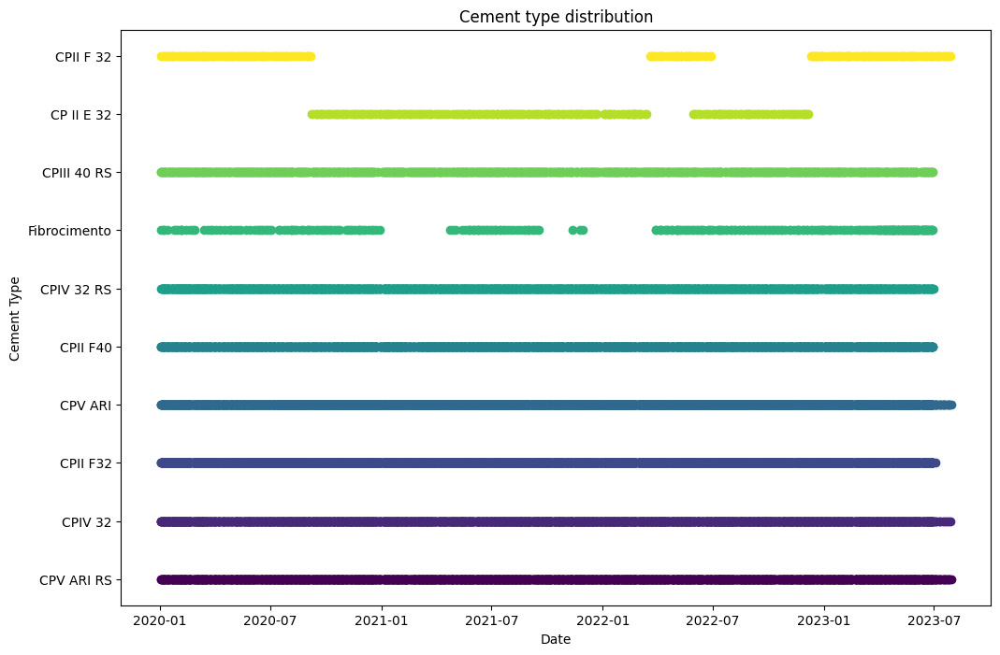

<IPython.core.display.Javascript object>

In [37]:
categories = df["Cement_Type"].unique()
colors = plt.cm.viridis(np.linspace(0, 1, len(categories)))

plt.figure(figsize=(12, 8))

for i, category in enumerate(categories):
    category_data = df[df["Cement_Type"] == category]
    category_data = category_data[category_data["Date"].dt.year != 1900]
    plt.scatter(
        category_data["Date"], [i] * len(category_data), c=colors[i], label=category
    )
plt.yticks(range(len(categories)), categories)
# plt.legend()
plt.xlabel("Date")
plt.ylabel("Cement Type")
plt.title("Cement type distribution")
plt.show()

In [38]:
dates = df["Date"].copy()

<IPython.core.display.Javascript object>

<h2>2. Quality Investigation</h2>

<h3>2.1. Unique values</h3>

<Axes: title={'center': 'Unique Values per feature'}>

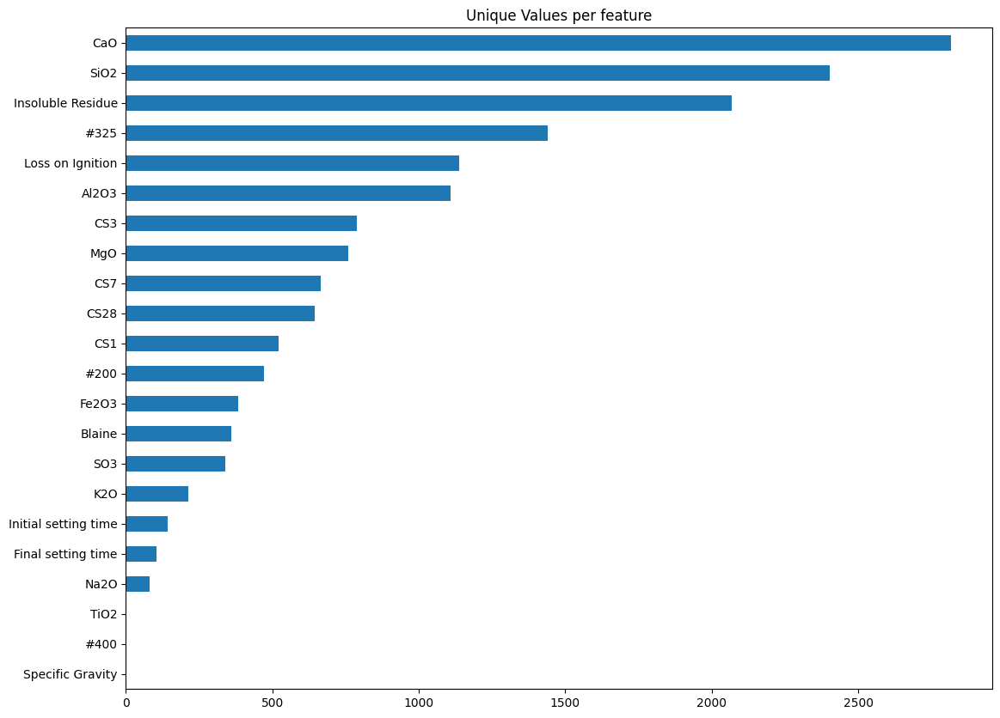

<IPython.core.display.Javascript object>

In [39]:
unique_values = df.select_dtypes(include="number").nunique().sort_values()
unique_values.plot.barh(logy=False, figsize=(13, 10), title="Unique Values per feature")

(array([0, 1, 2, 3]),
 [Text(0, 0, 'Plant'),
  Text(1, 0, 'City'),
  Text(2, 0, 'Cement_Type'),
  Text(3, 0, 'Date')])

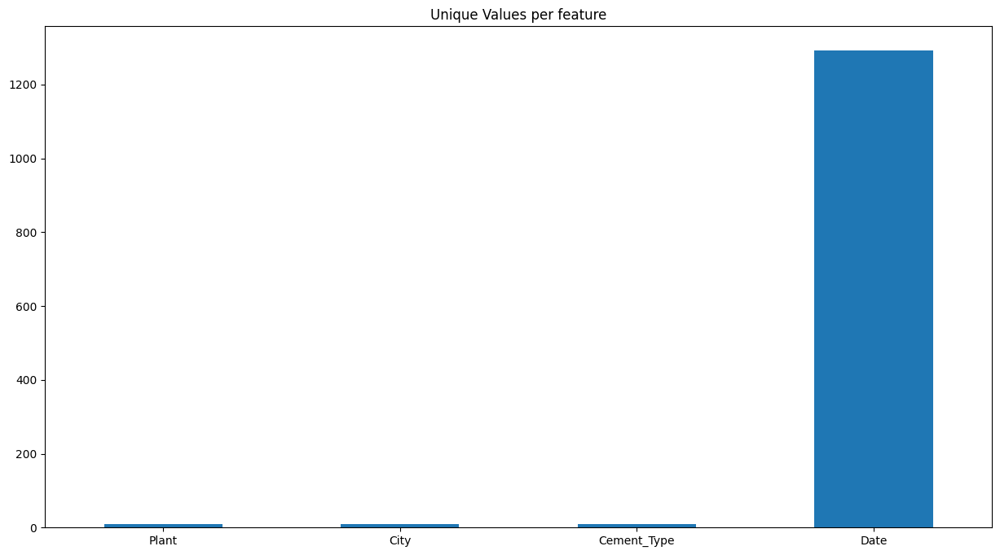

<IPython.core.display.Javascript object>

In [40]:
unique_values = df.select_dtypes(exclude="number").nunique().sort_values()

unique_values.plot.bar(logy=False, figsize=(15, 8), title="Unique Values per feature")

plt.xticks(rotation=0)

(array([0, 1, 2]),
 [Text(0, 0, 'Plant'), Text(1, 0, 'City'), Text(2, 0, 'Cement_Type')])

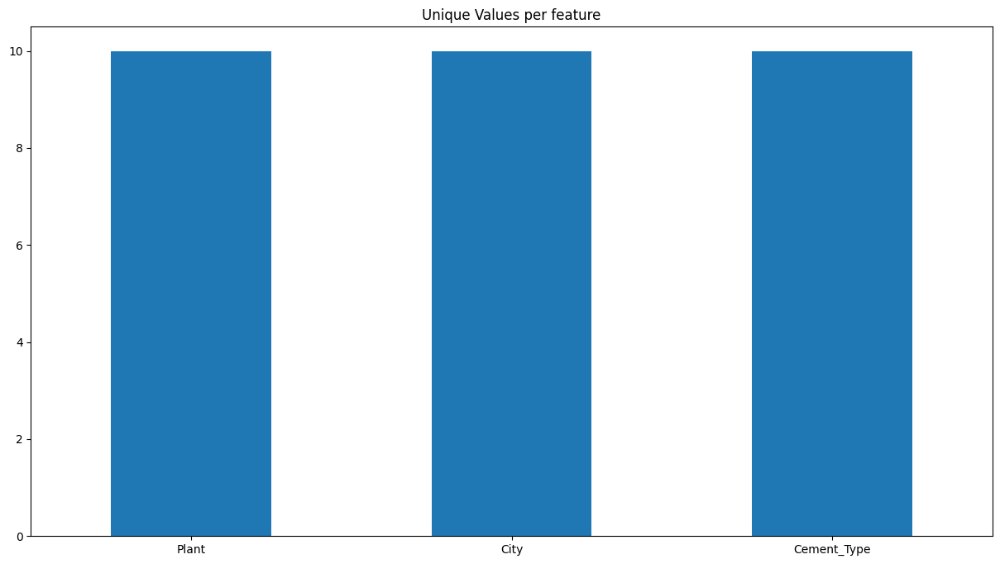

<IPython.core.display.Javascript object>

In [41]:
unique_values = (
    df.select_dtypes(exclude="number").drop("Date", axis=1).nunique().sort_values()
)

unique_values.plot.bar(logy=False, figsize=(15, 8), title="Unique Values per feature")

plt.xticks(rotation=0)

<h3>2.2. Missing values</h3>

In [42]:
print(
    "There are",
    df.isna().any().sum(),
    "variables with missing values from a total of",
    df.shape[1],
)

There are 22 variables with missing values from a total of 26


<IPython.core.display.Javascript object>

In [43]:
df.isna().any()

Plant                   False
City                    False
Date                    False
CaO                      True
MgO                      True
Na2O                     True
Al2O3                    True
SiO2                     True
SO3                      True
K2O                      True
TiO2                     True
Fe2O3                    True
Loss on Ignition         True
Insoluble Residue        True
Blaine                   True
#200                     True
#325                     True
#400                     True
Specific Gravity         True
Final setting time       True
Initial setting time     True
CS1                      True
CS3                      True
CS7                      True
CS28                     True
Cement_Type             False
dtype: bool

<IPython.core.display.Javascript object>

In [44]:
df.isna().sum().sort_values(ascending=False).to_frame(
    name="Missing (count)"
).style.background_gradient(cmap="Reds")

,Missing (count)
TiO2,16000
Specific Gravity,16000
#400,16000
Insoluble Residue,9497
CS1,5825
Al2O3,2907
CaO,2902
Fe2O3,2900
SiO2,2898
Na2O,2782


<IPython.core.display.Javascript object>

In [45]:
(df.isna().sum() / df.shape[0] * 100).sort_values(ascending=False).to_frame(
    name="Missing (%)"
).style.background_gradient(cmap="Reds")

,Missing (%)
TiO2,100.000000
Specific Gravity,100.000000
#400,100.000000
Insoluble Residue,59.356250
CS1,36.406250
Al2O3,18.168750
CaO,18.137500
Fe2O3,18.125000
SiO2,18.112500
Na2O,17.387500


<IPython.core.display.Javascript object>

<BarContainer object of 26 artists>

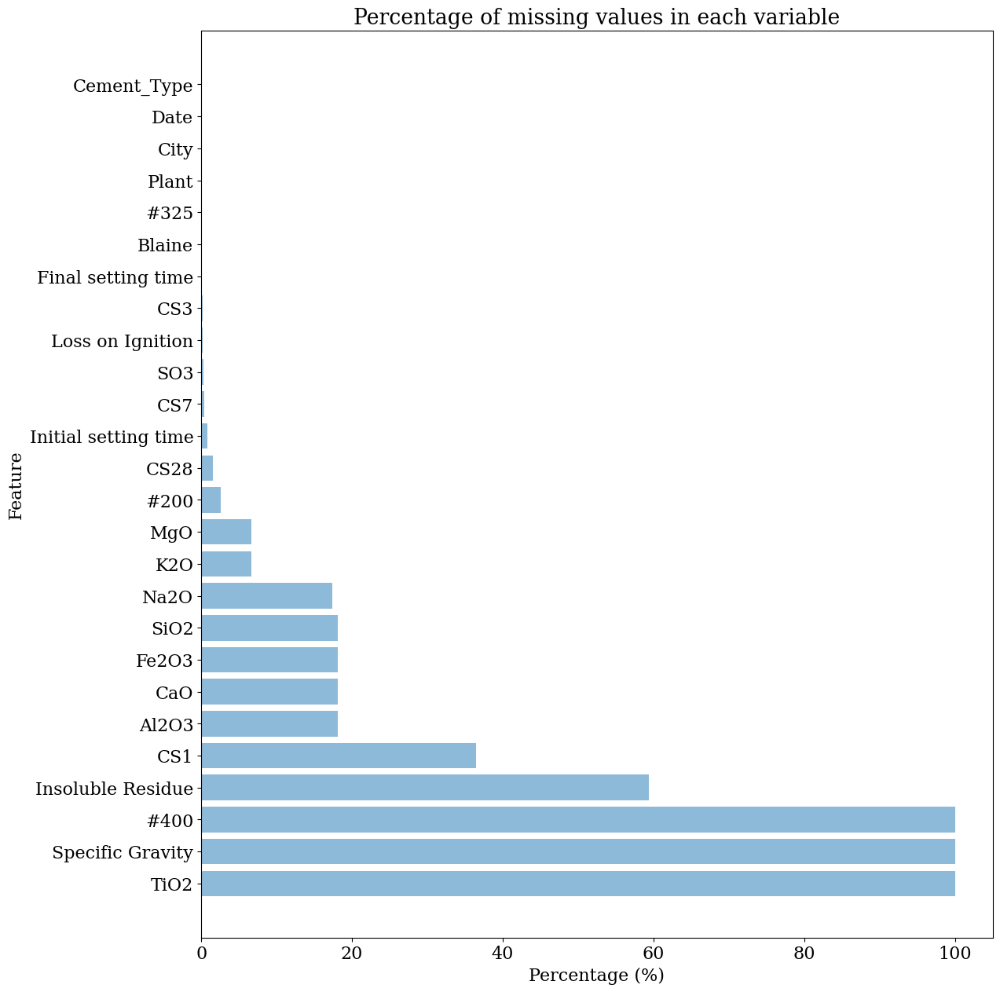

<IPython.core.display.Javascript object>

In [46]:
miss_perc = df.isnull().sum() / df.shape[0] * 100
miss_perc = miss_perc.sort_values(ascending=False)
plt.rc("font", family="serif", size=16)
plt.figure(figsize=(13, 15))
plt.title("Percentage of missing values in each variable")
plt.xlabel("Percentage (%)")
plt.ylabel("Feature")
plt.barh(miss_perc.index, miss_perc.round(2), alpha=0.5)

In [47]:
missing_values = []
for plant, group in df.groupby("Plant"):
    missing_percentages = (group.isna().sum() / group.shape[0]) * 100
    missing_percentages = missing_percentages.sort_values(ascending=False)
    missing_percentages = missing_percentages.to_frame(name=f"Missing (%) for {plant}")
    missing_values.append(missing_percentages.T)

result = pd.concat(missing_values)
result.T.style.background_gradient(cmap="Reds")

,Missing (%) for A,Missing (%) for AB,Missing (%) for AE,Missing (%) for AQ,Missing (%) for AY,Missing (%) for F,Missing (%) for I,Missing (%) for O,Missing (%) for R,Missing (%) for T
Specific Gravity,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
TiO2,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
#400,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
CS1,45.380435,0.000000,44.573284,28.388278,100.000000,33.296131,0.000000,39.371257,48.324397,60.373648
CS7,1.494565,0.000000,0.324675,0.610501,0.000000,0.595238,0.000000,0.000000,0.268097,0.000000
CaO,1.086957,79.447323,0.092764,0.732601,98.974359,0.595238,4.395604,0.523952,0.201072,0.098328
Fe2O3,0.951087,79.447323,0.092764,0.732601,99.179487,0.595238,4.395604,0.449102,0.201072,0.000000
K2O,0.951087,0.000000,0.092764,0.732601,100.000000,0.595238,4.395604,0.449102,0.201072,0.000000
SiO2,0.951087,79.447323,0.092764,0.732601,98.974359,0.595238,4.395604,0.449102,0.201072,0.000000
Al2O3,0.951087,79.447323,0.092764,0.671551,100.000000,0.595238,4.395604,0.449102,0.201072,0.000000


<IPython.core.display.Javascript object>

## Percentage of zeros each variable

In [48]:
zero_values = {}
for col in df.select_dtypes(include="number").columns:
    zero_percentages = (df[df[col].eq(0)].shape[0] / df.shape[0]) * 100
    zero_values[col] = zero_percentages

zero_percentages = pd.Series(zero_values, name=f"Zero (%) for {plant}")
zero_percentages = zero_percentages.sort_values(ascending=False)
zero_percentages = zero_percentages.to_frame(name=f"Zero (%) for {plant}")
zero_percentages.style.background_gradient(cmap="Reds")

,Zero (%) for T
Na2O,4.793750
Insoluble Residue,2.675000
#200,0.443750
Loss on Ignition,0.425000
Blaine,0.387500
Initial setting time,0.337500
Final setting time,0.337500
#325,0.300000
CS28,0.125000
MgO,0.087500


<IPython.core.display.Javascript object>

<h3>2.4. Duplicates</h3>

In [49]:
n_duplicates = df.duplicated().sum()
print(f"There are {n_duplicates} duplicates samples.")

There are 12 duplicates samples.


<IPython.core.display.Javascript object>

<h2>3. Content Investigation</h2>

<h3>3.1. Feature distribution</h3>

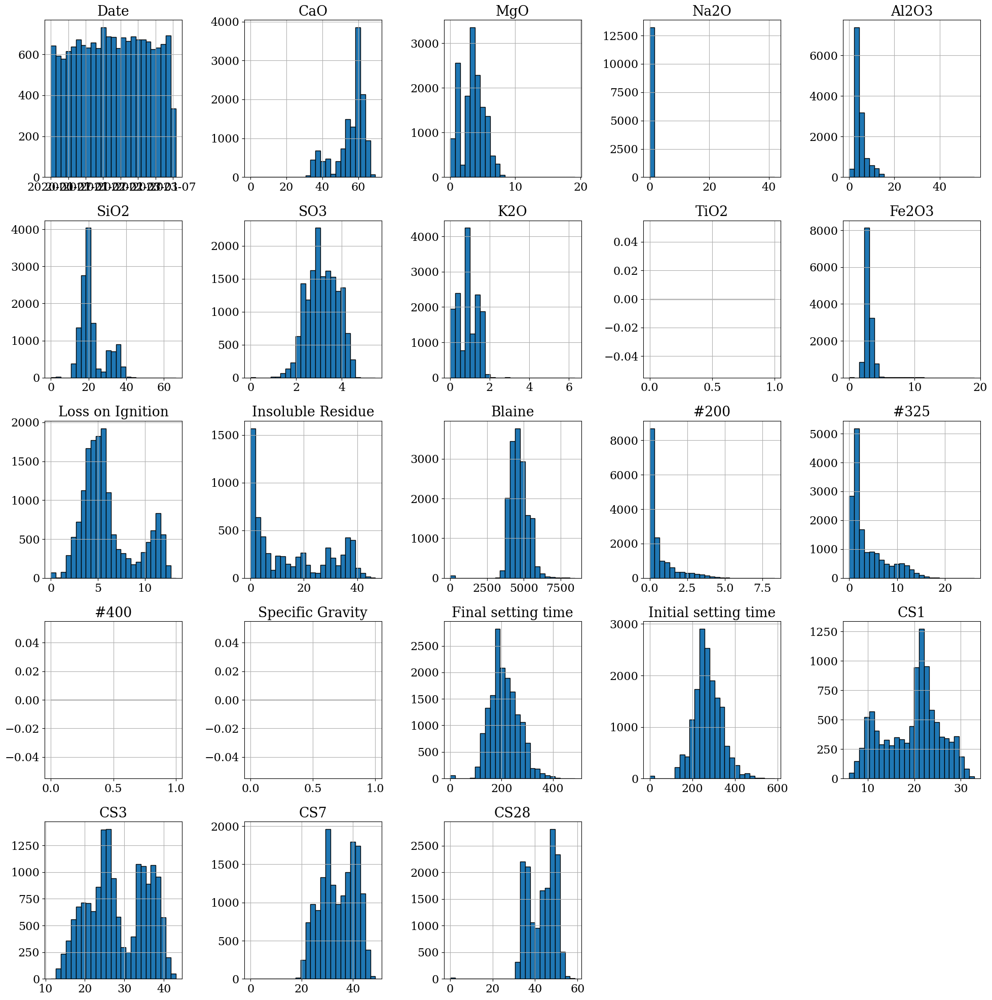

<IPython.core.display.Javascript object>

In [50]:
df.hist(bins=25, figsize=(20, 20), layout=(-1, 5), edgecolor="black")
plt.tight_layout()

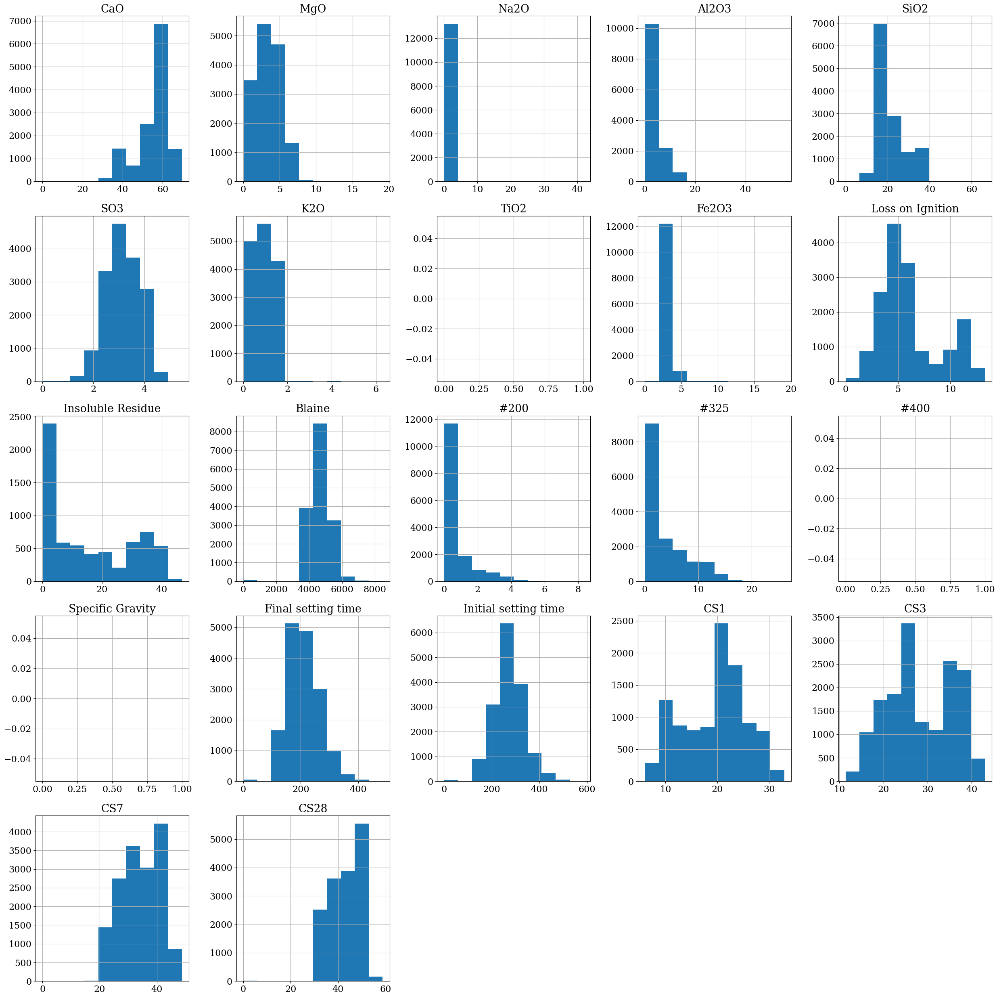

<IPython.core.display.Javascript object>

In [51]:
df.select_dtypes(include="float64").hist(
    figsize=(25, 25),
)
plt.tight_layout()

<h3>Data distribution - KDE plot</h3>

Kdeplot is a Kernel Distribution Estimation Plot which depicts the probability density function of the continuous or non-parametric data variables

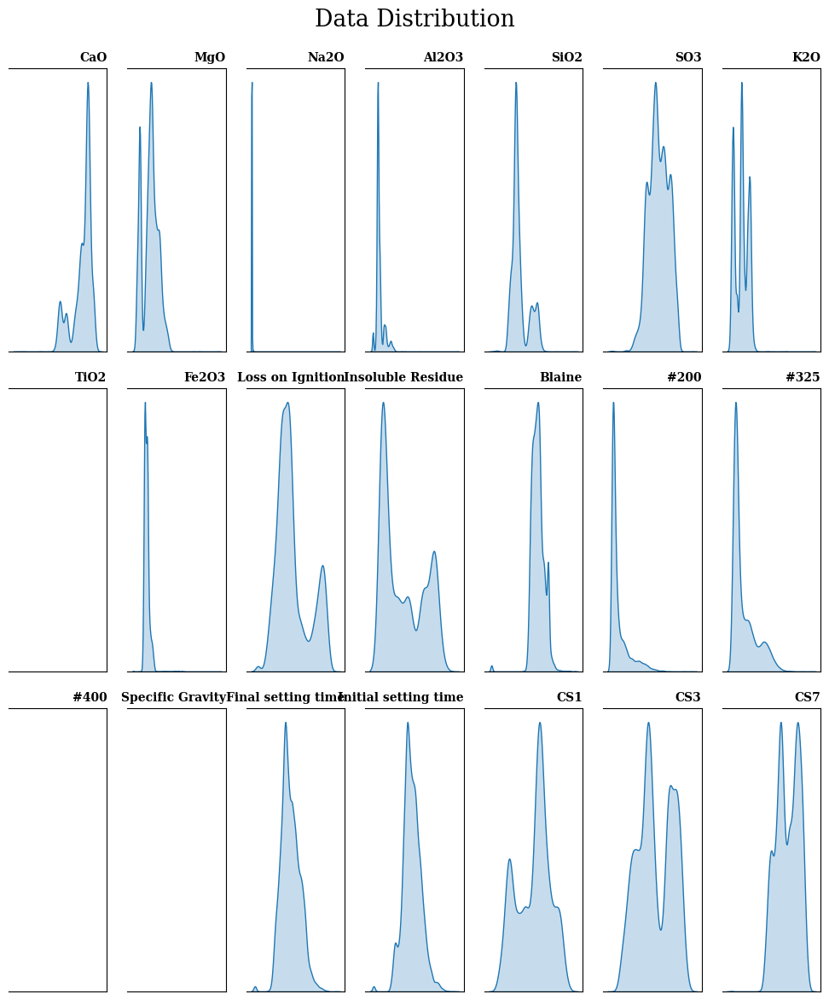

<IPython.core.display.Javascript object>

In [52]:
warnings.filterwarnings("ignore")

fig, axes = plt.subplots(3, 7, figsize=(10, 12))
axes = axes.flatten()
# sns.set_palette(sns.color_palette(["#2a9d8f", "#e9c46a"]))
columns = df.select_dtypes(include="float64").columns

for i, ax in enumerate(axes):
    sns.kdeplot(data=df[columns], x=columns[i], ax=ax, palette=["#2a9d8f"], fill=True)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.spines["left"].set_visible(False)
    ax.set_title(columns[i], loc="right", weight="bold", fontsize=10)

# fig.supxlabel('Average (float features)', ha='center', fontweight='bold')
fig.suptitle("Data Distribution")

fig.tight_layout()
plt.show()

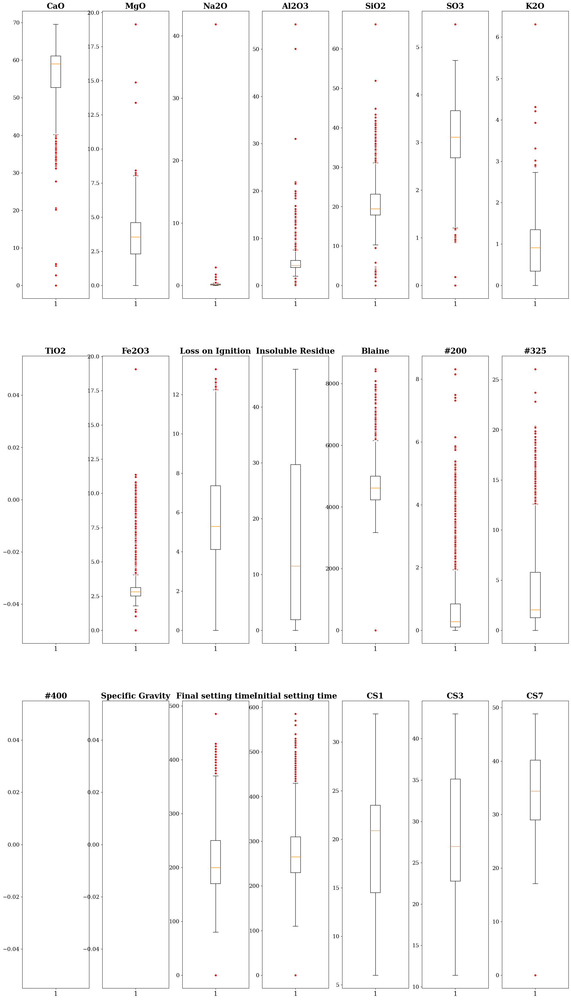

<IPython.core.display.Javascript object>

In [53]:
# Creating subplot of each column with its own scale
float64_columns = df.select_dtypes(include="float64").columns
df_float64_columns = df[float64_columns]

red_circle = dict(markerfacecolor="red", marker="o", markeredgecolor="white")
fig, axs = plt.subplots(3, 7, figsize=(25, 45))

for i, ax in enumerate(axs.flat):
    ax.boxplot(df_float64_columns.iloc[:, i].dropna(), flierprops=red_circle)
    ax.set_title(df_float64_columns.columns[i], fontsize=20, fontweight="bold")
    ax.tick_params(axis="y", labelsize=14)

<h3>3.3. Feature Relationship</h3>

<h4>3.3.1 Pearson</h4>

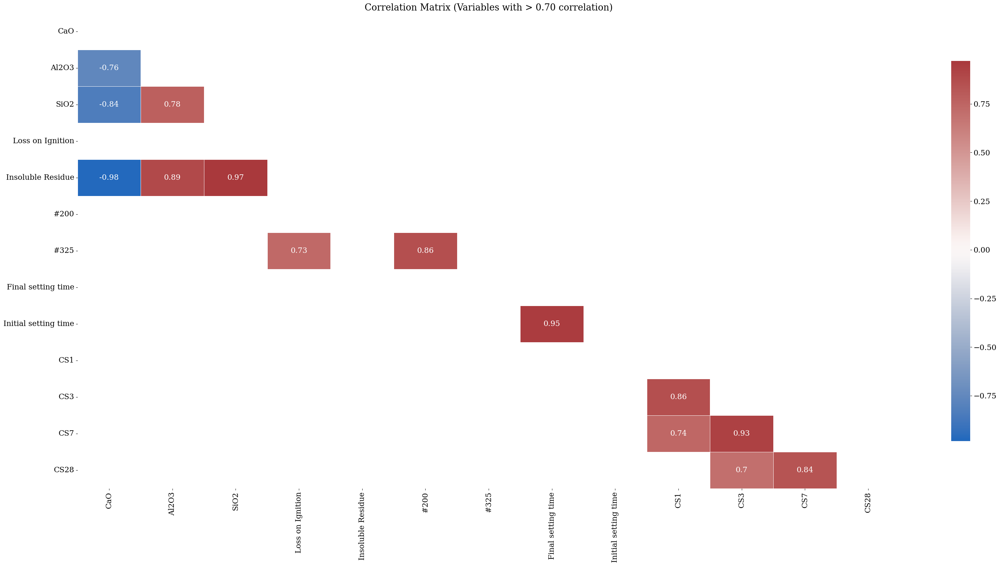

<IPython.core.display.Javascript object>

In [54]:
df_corr = df.drop(["Plant", "Date", "City", "Cement_Type"], axis=1).corr(
    method="pearson"
)


# plt.figure(figsize=(17, 13))
fig, ax = plt.subplots(figsize=(33, 17))

df_corr = df_corr[(abs(df_corr) > 0.70) & (abs(df_corr) < 1)]
df_corr = df_corr.dropna(how="all", axis=1).dropna(how="all", axis=0)
labels = np.where(
    np.abs(df_corr) >= 0.7, np.round(df_corr[np.abs(df_corr) >= 0.70], 2), ""
)

plt.title("Correlation Matrix (Variables with > 0.70 correlation)")
# plt.show()

sns.heatmap(
    df_corr,
    mask=np.triu(np.ones_like(df_corr, dtype=bool)),
    square=False,
    center=0,
    annot=labels,
    fmt="",
    linewidths=0.5,
    cmap="vlag",
    cbar_kws={"shrink": 0.8},
    ax=ax,
)

plt.tight_layout()

In [55]:
corr_matrix = (
    df.drop(["Plant", "Date", "City", "Cement_Type"], axis=1)
    .corr(method="pearson")
    .abs()
)

sol = (
    corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    .stack()
    .sort_values(ascending=False)
)

sol[sol >= 0.70]

CaO                 Insoluble Residue       0.983173
SiO2                Insoluble Residue       0.970988
Final setting time  Initial setting time    0.949146
CS3                 CS7                     0.930985
Al2O3               Insoluble Residue       0.892780
CS1                 CS3                     0.861508
#200                #325                    0.860981
CS7                 CS28                    0.839812
CaO                 SiO2                    0.836172
Al2O3               SiO2                    0.779349
CaO                 Al2O3                   0.758813
CS1                 CS7                     0.741195
Loss on Ignition    #325                    0.728963
CS3                 CS28                    0.702079
dtype: float64

<IPython.core.display.Javascript object>

In [56]:
sol[sol.index.map(lambda x: "CS28" in x)]

CS7                   CS28    0.839812
CS3                   CS28    0.702079
#325                  CS28    0.614084
#200                  CS28    0.559016
Loss on Ignition      CS28    0.523512
CS1                   CS28    0.521503
Final setting time    CS28    0.426464
Initial setting time  CS28    0.391854
CaO                   CS28    0.361012
SO3                   CS28    0.285855
Insoluble Residue     CS28    0.263721
SiO2                  CS28    0.250847
Al2O3                 CS28    0.165336
Fe2O3                 CS28    0.086404
Blaine                CS28    0.072691
K2O                   CS28    0.032216
Na2O                  CS28    0.009856
MgO                   CS28    0.004394
dtype: float64

<IPython.core.display.Javascript object>

<h4>3.3.2 Spearman</h4>

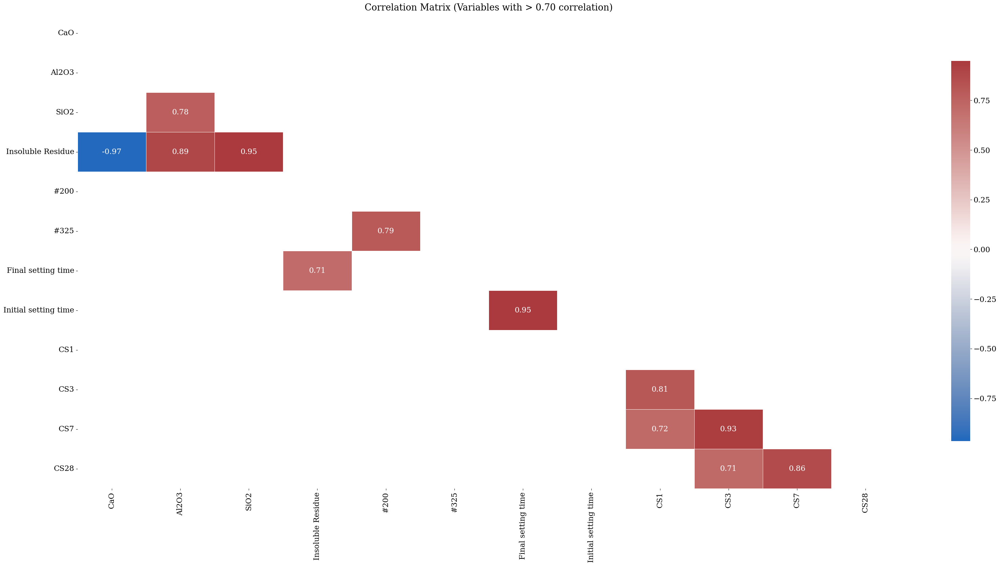

<IPython.core.display.Javascript object>

In [57]:
df_corr = df.drop(["Plant", "Date", "City", "Cement_Type"], axis=1).corr(
    method="spearman"
)


# plt.figure(figsize=(17, 13))
fig, ax = plt.subplots(figsize=(33, 17))

df_corr = df_corr[(abs(df_corr) > 0.70) & (abs(df_corr) < 1)]
df_corr = df_corr.dropna(how="all", axis=1).dropna(how="all", axis=0)
labels = np.where(
    np.abs(df_corr) >= 0.7, np.round(df_corr[np.abs(df_corr) >= 0.70], 2), ""
)

plt.title("Correlation Matrix (Variables with > 0.70 correlation)")
# plt.show()

sns.heatmap(
    df_corr,
    mask=np.triu(np.ones_like(df_corr, dtype=bool)),
    square=False,
    center=0,
    annot=labels,
    fmt="",
    linewidths=0.5,
    cmap="vlag",
    cbar_kws={"shrink": 0.8},
    ax=ax,
)

plt.tight_layout()

In [58]:
corr_matrix = (
    df.drop(["Plant", "Date", "City", "Cement_Type"], axis=1)
    .corr(method="spearman")
    .abs()
)

sol = (
    corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    .stack()
    .sort_values(ascending=False)
)

sol[sol >= 0.70]

CaO                 Insoluble Residue       0.965216
Final setting time  Initial setting time    0.948602
SiO2                Insoluble Residue       0.947394
CS3                 CS7                     0.929451
Al2O3               Insoluble Residue       0.891021
CS7                 CS28                    0.861175
CS1                 CS3                     0.813775
#200                #325                    0.793949
Al2O3               SiO2                    0.775901
CS1                 CS7                     0.715230
CS3                 CS28                    0.714117
Insoluble Residue   Final setting time      0.707005
dtype: float64

<IPython.core.display.Javascript object>

In [59]:
sol[sol.index.map(lambda x: "CS28" in x)]

CS7                   CS28    0.861175
CS3                   CS28    0.714117
#200                  CS28    0.623471
#325                  CS28    0.589405
CS1                   CS28    0.452906
Final setting time    CS28    0.422083
CaO                   CS28    0.403768
Loss on Ignition      CS28    0.403496
Initial setting time  CS28    0.376516
SO3                   CS28    0.292187
Insoluble Residue     CS28    0.284265
SiO2                  CS28    0.152382
Blaine                CS28    0.123802
Fe2O3                 CS28    0.095127
Al2O3                 CS28    0.078191
Na2O                  CS28    0.038766
K2O                   CS28    0.037691
MgO                   CS28    0.032691
dtype: float64

<IPython.core.display.Javascript object>

<h4>3.3.1 Kendall</h4>

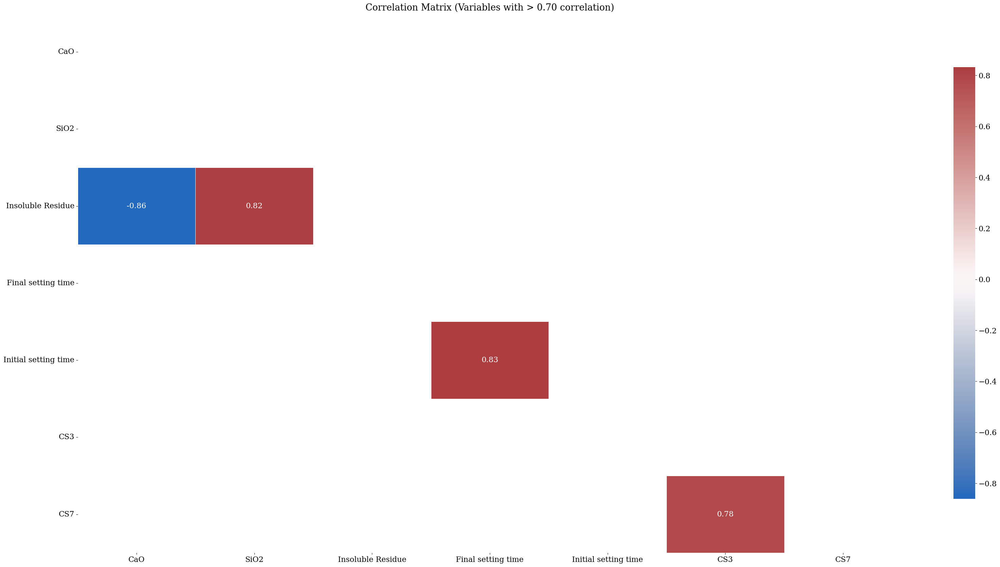

<IPython.core.display.Javascript object>

In [60]:
df_corr = df.drop(["Plant", "Date", "City", "Cement_Type"], axis=1).corr(
    method="kendall"
)


# plt.figure(figsize=(17, 13))
fig, ax = plt.subplots(figsize=(33, 17))

df_corr = df_corr[(abs(df_corr) > 0.70) & (abs(df_corr) < 1)]
df_corr = df_corr.dropna(how="all", axis=1).dropna(how="all", axis=0)
labels = np.where(
    np.abs(df_corr) >= 0.7, np.round(df_corr[np.abs(df_corr) >= 0.70], 2), ""
)

plt.title("Correlation Matrix (Variables with > 0.70 correlation)")
# plt.show()

sns.heatmap(
    df_corr,
    mask=np.triu(np.ones_like(df_corr, dtype=bool)),
    square=False,
    center=0,
    annot=labels,
    fmt="",
    linewidths=0.5,
    cmap="vlag",
    cbar_kws={"shrink": 0.8},
    ax=ax,
)

plt.tight_layout()

In [61]:
corr_matrix = (
    df.drop(["Plant", "Date", "City", "Cement_Type"], axis=1)
    .corr(method="kendall")
    .abs()
)

sol = (
    corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    .stack()
    .sort_values(ascending=False)
)

sol[sol >= 0.70]

CaO                 Insoluble Residue       0.861209
Final setting time  Initial setting time    0.831768
SiO2                Insoluble Residue       0.823937
CS3                 CS7                     0.778941
dtype: float64

<IPython.core.display.Javascript object>

In [62]:
sol[sol.index.map(lambda x: "CS28" in x)]

CS7                   CS28    0.661904
CS3                   CS28    0.520677
#200                  CS28    0.431306
#325                  CS28    0.403207
CS1                   CS28    0.325593
Final setting time    CS28    0.299048
CaO                   CS28    0.278272
Loss on Ignition      CS28    0.262077
Initial setting time  CS28    0.261791
Insoluble Residue     CS28    0.220778
SO3                   CS28    0.195167
SiO2                  CS28    0.119082
Blaine                CS28    0.079592
Fe2O3                 CS28    0.072242
K2O                   CS28    0.041599
Al2O3                 CS28    0.030814
Na2O                  CS28    0.024035
MgO                   CS28    0.014615
dtype: float64

<IPython.core.display.Javascript object>

#### Bivariate Analysis

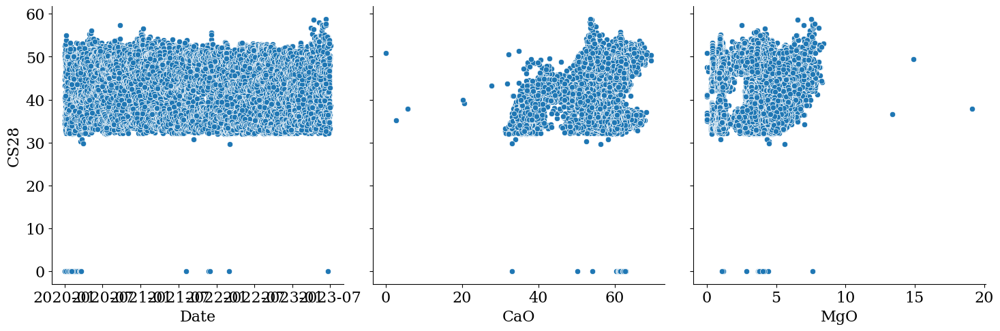

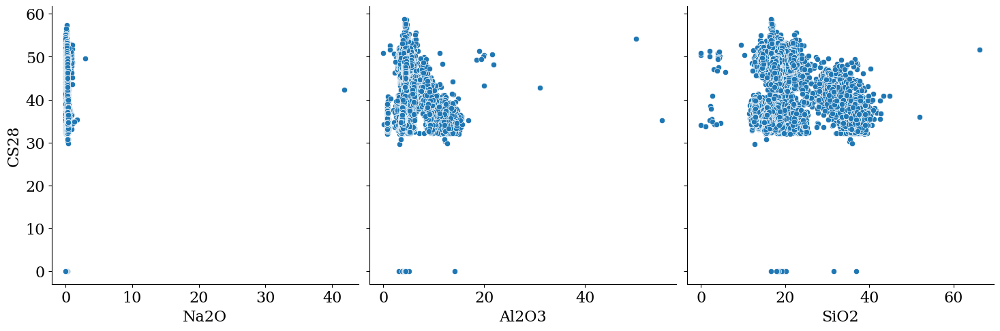

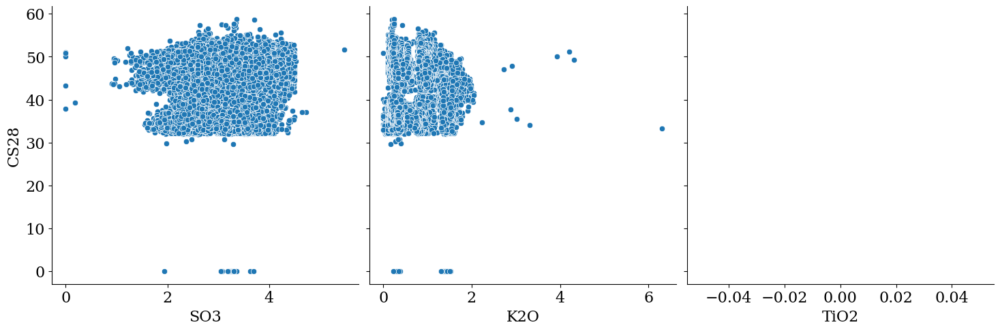

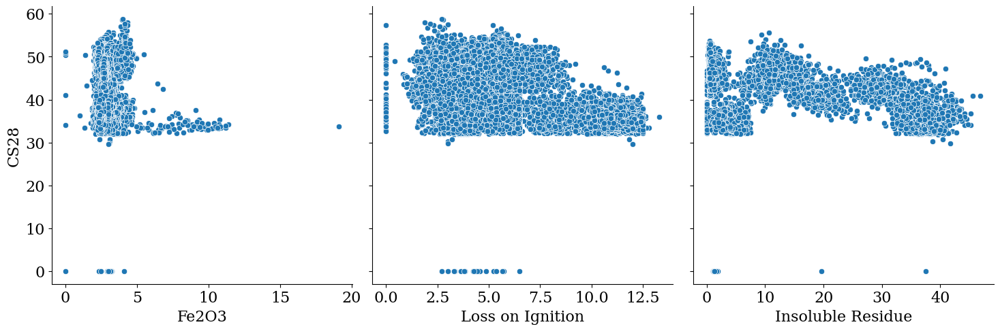

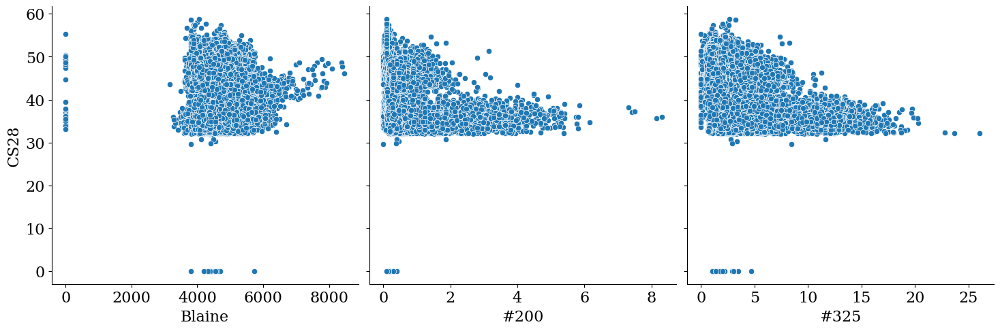

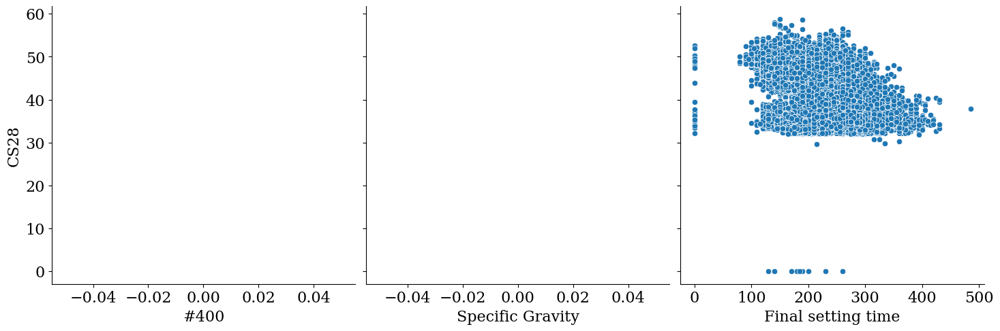

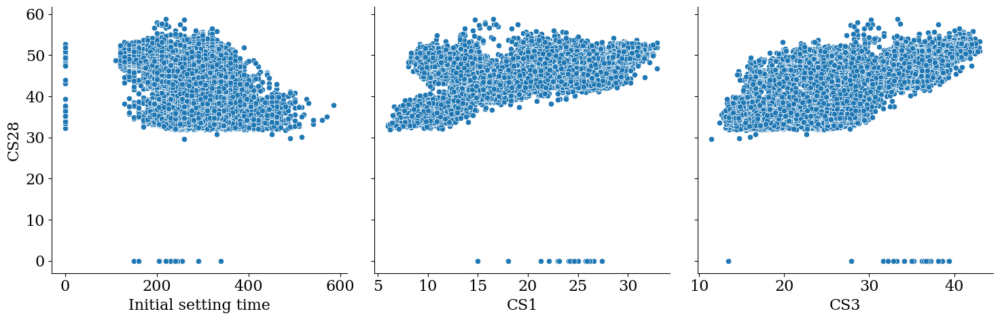

<IPython.core.display.Javascript object>

In [63]:
num_lines = 7
plots_per_line = 3

variables_to_plot = df.select_dtypes(exclude=object).columns.tolist()
variables_to_plot.remove("CS28")

warnings.filterwarnings("ignore")

for n in range(num_lines):
    start_idx = n * plots_per_line
    end_idx = start_idx + plots_per_line

    grid = sns.pairplot(
        df,
        x_vars=variables_to_plot[start_idx:end_idx],
        y_vars=["CS28"],
        diag_kind="kde",
        kind="scatter",
        height=5,
    )

# grid.fig.suptitle(
#     "Bivariate Analysis: Variables vs. 28-day Compressive Strength", y=1.02
# )
plt.tight_layout()
plt.show()

In [64]:
def corrfunc(x, y, ax=None, **kws):
    """Plot the correlation coefficient in the top left hand corner of a plot."""
    r, _ = pearsonr(x, y)
    ax = ax or plt.gca()
    ax.annotate(f"ρ = {r:.2f}", xy=(0.1, 0.9), xycoords=ax.transAxes)
    return None

<IPython.core.display.Javascript object>

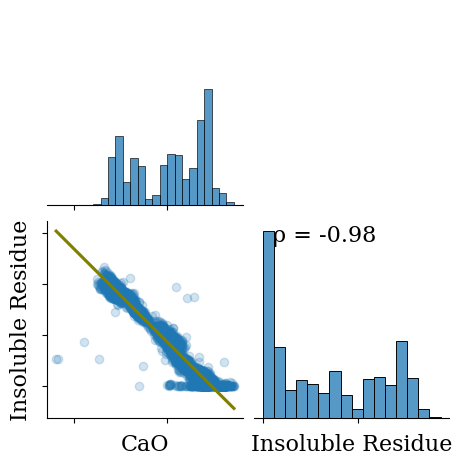

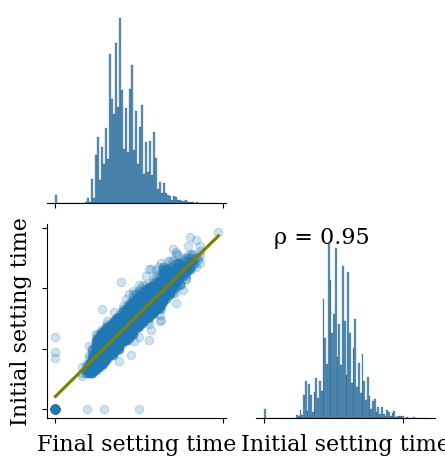

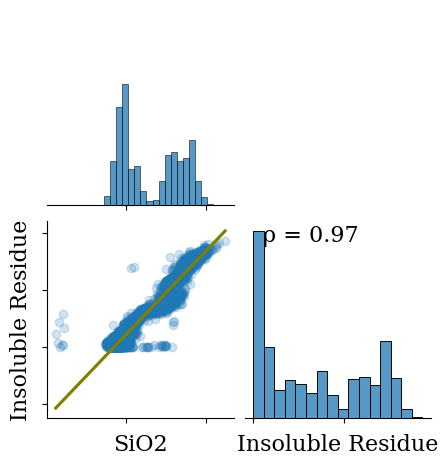

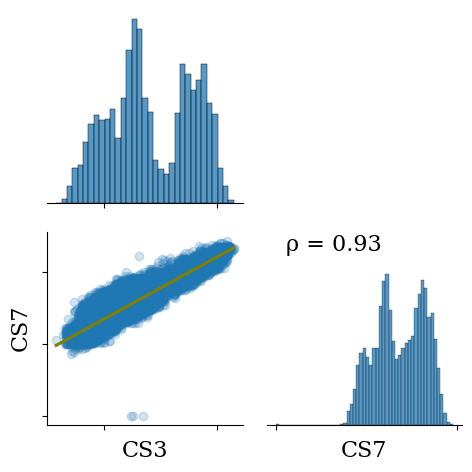

<IPython.core.display.Javascript object>

In [65]:
warnings.filterwarnings("ignore")

for pair in sol[sol > 0.75].index.values:
    if pair[0] != pair[1]:
        data = df[[pair[0], pair[1]]].dropna()
        g = sns.pairplot(
            data,
            corner=True,
            kind="reg",
            plot_kws={"line_kws": {"color": "olive"}, "scatter_kws": {"alpha": 0.2}},
        )
        corrfunc(data[pair[0]], data[pair[1]])
        g.set(xticklabels=[])
        g.set(yticklabels=[])

plt.tight_layout()

### 4. Date/TimeVariable Analyses

In [66]:
# How many days are valid datas e.g not weekends

valid_days = np.count_nonzero(
    np.is_busday(dates.apply(lambda x: x.date()).unique().astype("datetime64"))
)
print(valid_days, "valid days out of", len(dates.apply(lambda x: x.date()).unique()))

925 valid days out of 1293


<IPython.core.display.Javascript object>

In [67]:
# What are the years the data was collected?
years = set(map(lambda date: date.year, dates))
print("Years present in the data:", years)

Years present in the data: {2020, 2021, 2022, 2023}


<IPython.core.display.Javascript object>

In [68]:
# What are months the data was collected for every year?

months_each_year = {}
for year in years:
    months_each_year[year] = set([date.month for date in dates if date.year == year])

print("Months of data for each year:")
months_each_year

Months of data for each year:


{2020: {1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12},
 2021: {1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12},
 2022: {1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12},
 2023: {1, 2, 3, 4, 5, 6, 7}}

<IPython.core.display.Javascript object>

In [69]:
# How many unique days every month has for every year?

year = dates.dt.year
month = dates.dt.month
day = dates.dt.day

# Create a dataframe with the year and month of each date
df_year_month = pd.DataFrame({"Year": year, "Month": month, "Day": day})

# Count the number of dates in each year and month
df_year_month = df_year_month.groupby(["Year", "Month"])["Day"].apply(
    lambda x: len(x.unique())
)

# Give a name to the series
df_year_month.name = "Unique days per month"

# Print the dataframe
print(df_year_month)

Year  Month
2020  1        30
      2        29
      3        31
      4        30
      5        31
      6        30
      7        31
      8        31
      9        30
      10       31
      11       30
      12       30
2021  1        30
      2        28
      3        31
      4        30
      5        31
      6        30
      7        31
      8        31
      9        30
      10       31
      11       30
      12       30
2022  1        30
      2        28
      3        31
      4        30
      5        31
      6        30
      7        31
      8        31
      9        30
      10       31
      11       30
      12       31
2023  1        30
      2        27
      3        31
      4        30
      5        31
      6        29
      7        24
Name: Unique days per month, dtype: int64


<IPython.core.display.Javascript object>

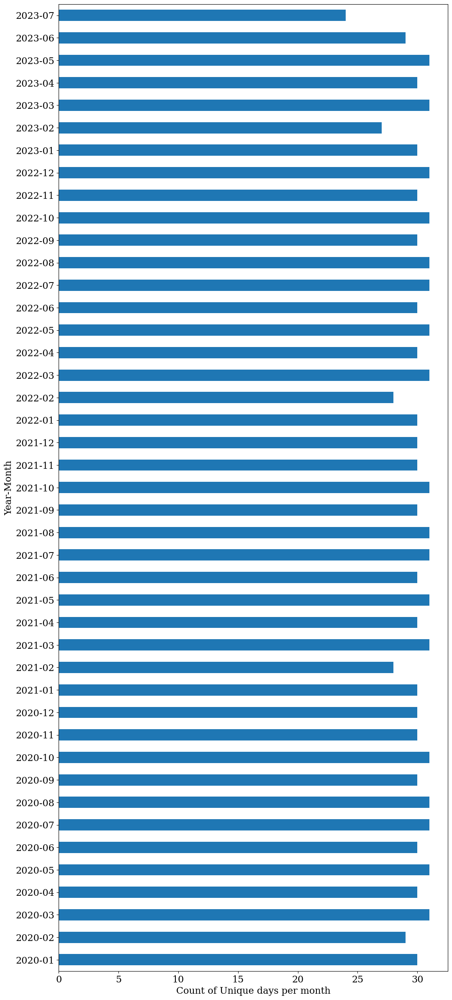

<IPython.core.display.Javascript object>

In [70]:
df_year_month_copy = df_year_month.copy()
df_year_month.index.map(lambda x: f"{x[0]}-{x[1]:02d}"),

df_year_month_copy.index = (
    pd.to_datetime(
        df_year_month.index.map(lambda x: f"{x[0]}-{x[1]:02d}"), format="%Y-%m"
    ).to_period("M")
    # .strftime("%b %Y")
)
df_year_month_copy.index

plt.figure(figsize=(12, 30))
ax = df_year_month_copy.plot(kind="barh")
ax.set_ylabel("Year-Month")
ax.set_xlabel("Count of Unique days per month")
None

In [71]:
# How many data points every month has for every year?

year = dates.dt.year
month = dates.dt.month

# Create a dataframe with the year and month of each date
df_year_month = pd.DataFrame({"Year": year, "Month": month})

# Count the number of dates in each year and month
df_year_month = df_year_month.groupby(["Year", "Month"]).size()

# Give a name to the series
df_year_month.name = "size"

# Print the dataframe
print(df_year_month)

Year  Month
2020  1        365
      2        330
      3        375
      4        320
      5        345
      6        359
      7        372
      8        370
      9        380
      10       398
      11       381
      12       384
2021  1        375
      2        328
      3        405
      4        355
      5        394
      6        398
      7        409
      8        439
      9        403
      10       375
      11       394
      12       374
2022  1        379
      2        356
      3        410
      4        363
      5        428
      6        383
      7        402
      8        430
      9        382
      10       369
      11       369
      12       376
2023  1        387
      2        318
      3        400
      4        368
      5        430
      6        364
      7         58
Name: size, dtype: int64


<IPython.core.display.Javascript object>

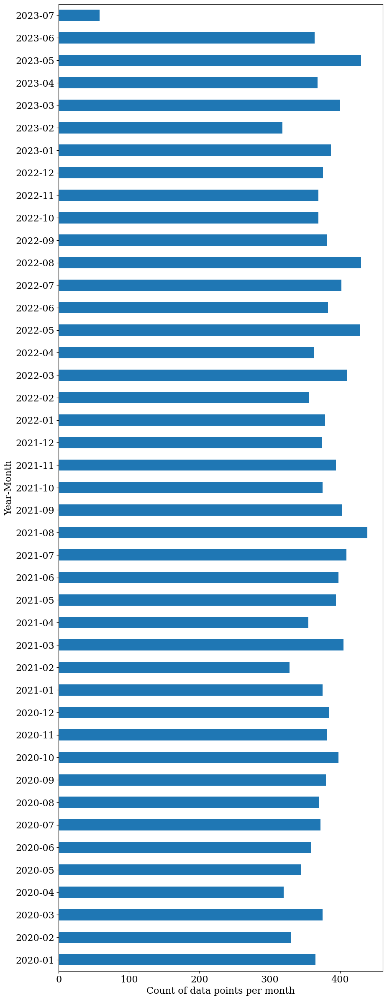

<IPython.core.display.Javascript object>

In [72]:
df_year_month_copy = df_year_month.copy()
df_year_month.index.map(lambda x: f"{x[0]}-{x[1]:02d}"),

df_year_month_copy.index = (
    pd.to_datetime(
        df_year_month.index.map(lambda x: f"{x[0]}-{x[1]:02d}"), format="%Y-%m"
    ).to_period("M")
    # .strftime("%b %Y")
)
df_year_month_copy.index

plt.figure(figsize=(10, 30))
ax = df_year_month_copy.plot(kind="barh")
ax.set_ylabel("Year-Month")
ax.set_xlabel("Count of data points per month")
None

In [73]:
# What is the year-month with the minimum and maximum number of collected data points?

df_reseted = df_year_month.reset_index()
df_reseted["Year_Month"] = (
    df_reseted["Year"].apply(str) + "-" + df_reseted["Month"].apply(str)
)

min_obs_key, min_obs_value = df_reseted[df_reseted["size"] == df_reseted["size"].min()][
    ["Year_Month", "size"]
].values[0]

max_obs_key, max_obs_value = df_reseted[df_reseted["size"] == df_reseted["size"].max()][
    ["Year_Month", "size"]
].values[0]


print(min_obs_key, "has the minimum number of days with samples -", min_obs_value)
print(max_obs_key, "has the maximum number of days with samples -", max_obs_value)

2023-7 has the minimum number of days with samples - 58
2021-8 has the maximum number of days with samples - 439


<IPython.core.display.Javascript object>

In [74]:
# What is the mean number of observations per year?

mean_obs_per_year = df_year_month.groupby(["Year"]).mean(["size"]).apply(int).to_dict()

print("Mean Number of observations - per year")
print(mean_obs_per_year)
print()
print("Mean number of observations - all years")
print(int(df_year_month.mean()))

Mean Number of observations - per year
{2020: 364, 2021: 387, 2022: 387, 2023: 332}

Mean number of observations - all years
372


<IPython.core.display.Javascript object>

In [75]:
# How many times every day reapeats for each year-month?

year = dates.dt.year
month = dates.dt.month
day = dates.dt.day
# Create a dataframe with the year and month of each date
df_year_month = pd.DataFrame({"Year": year, "Month": month, "Day": day})


# Group by year, month, and day, and count occurrences
day_counts = (
    df_year_month.groupby(["Year", "Month", "Day"]).size().reset_index(name="DayCount")
)

day_counts[["DayCount"]].describe()

,DayCount
count,1293.000000
mean,12.374323
std,5.852471
min,1.000000
25%,7.000000
50%,13.000000
75%,17.000000
max,25.000000


<IPython.core.display.Javascript object>

In [76]:
day_counts[["DayCount"]].value_counts()

DayCount
7           107
15           98
6            87
16           84
19           83
9            81
17           79
8            79
5            73
18           72
14           60
4            51
20           51
10           50
11           33
13           31
21           30
22           28
12           27
23           26
3            22
2            19
24           11
1             7
25            4
Name: count, dtype: int64

<IPython.core.display.Javascript object>

In [77]:
day_counts[day_counts["DayCount"] == day_counts["DayCount"].max()]

,Year,Month,Day,DayCount
626,2021,9,21,25
862,2022,5,17,25
883,2022,6,7,25
995,2022,9,27,25


<IPython.core.display.Javascript object>

### Compressive Strength Distribution

#### 1 Day

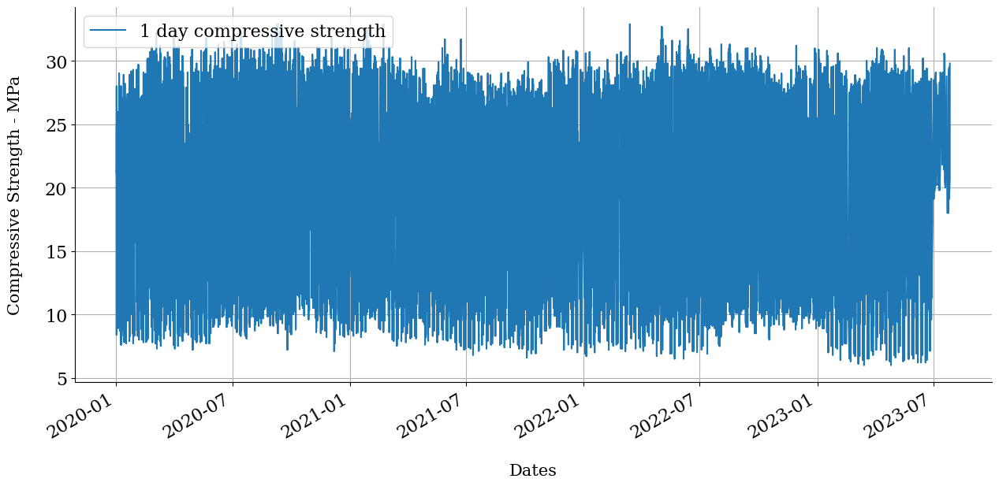

<IPython.core.display.Javascript object>

In [78]:
tmp = df[["Date", "CS1"]].dropna().copy()
tmp = tmp[tmp["Date"].dt.year != 1900].reset_index(drop=True)
tmp = tmp.set_index("Date")

fig, ax = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(15, 7))
tmp.plot(ax=ax)
ax.grid(which="both")
ax.legend(["1 day compressive strength"], loc="upper left")
ax.set_xlabel("Dates", labelpad=20, fontsize=15)
ax.set_ylabel("Compressive Strength - MPa", labelpad=20, fontsize=15)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

plt.show()

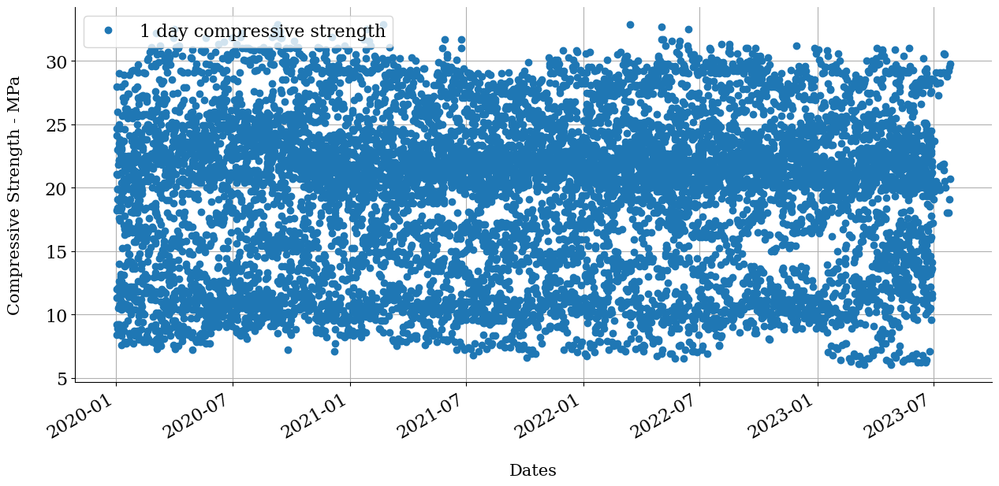

<IPython.core.display.Javascript object>

In [79]:
tmp = df[["Date", "CS1"]].dropna().copy()
tmp = tmp[tmp["Date"].dt.year != 1900].reset_index(drop=True)
tmp = tmp.set_index("Date")

fig, ax = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(15, 7))
tmp.plot(ax=ax, marker="o", linestyle="")
ax.grid(which="both")
ax.legend(["1 day compressive strength"], loc="upper left")
ax.set_xlabel("Dates", labelpad=20, fontsize=15)
ax.set_ylabel("Compressive Strength - MPa", labelpad=20, fontsize=15)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

plt.show()

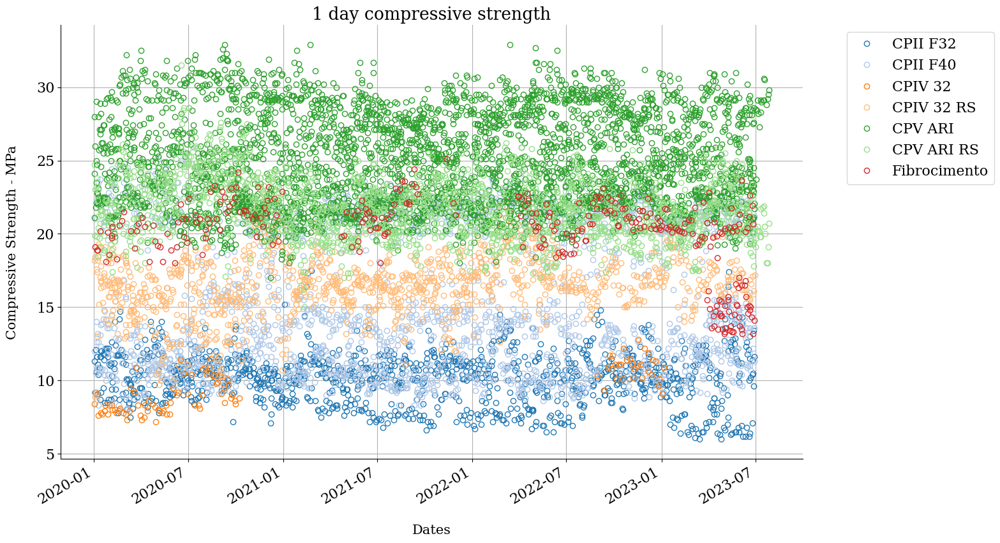

<IPython.core.display.Javascript object>

In [80]:
tmp = df[["Date", "CS1", "Cement_Type"]].dropna().copy()
tmp = tmp[(tmp["Date"].dt.year != 1900) & (tmp["Date"].dt.year > 2012)].reset_index(
    drop=True
)
tmp = tmp.set_index("Date")

fig, ax = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(15, 10))

# Iterate through cement types and plot with unique colors and labels
colors = plt.cm.get_cmap("tab20").colors  # Choose a colormap with enough colors
labels = []  # Empty list to store cement type labels for legend
for i, (cement_type, group_data) in enumerate(tmp.groupby("Cement_Type")):
    labels.append(cement_type)  # Add cement type to labels list
    group_data.plot(
        ax=ax,
        marker="o",
        linestyle="",
        color=colors[i],
        label=cement_type,
        markerfacecolor="None",
    )

ax.grid(which="both")
ax.legend(
    # title="1 day compressive strength",
    loc="upper left",
    bbox_to_anchor=(1.05, 1),
    labels=labels,
)  # Update legend with labels list
ax.set_xlabel("Dates", labelpad=20, fontsize=15)
ax.set_ylabel("Compressive Strength - MPa", labelpad=20, fontsize=15)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.set_title("1 day compressive strength")

plt.show()

#### 3 Days

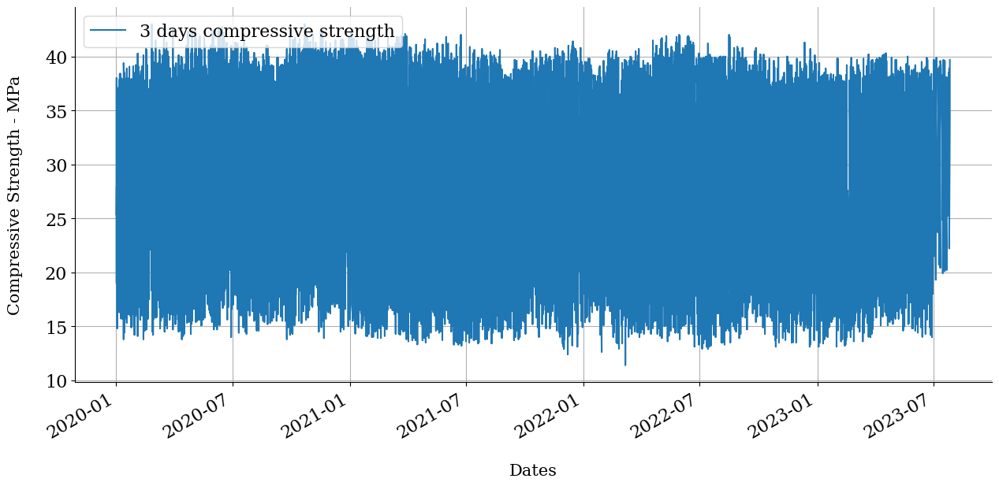

<IPython.core.display.Javascript object>

In [81]:
tmp = df[["Date", "CS3"]].dropna().copy()
tmp = tmp[tmp["Date"].dt.year != 1900].reset_index(drop=True)
tmp = tmp.set_index("Date")

fig, ax = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(15, 7))
tmp.plot(ax=ax)
ax.grid(which="both")
ax.legend(["3 days compressive strength"], loc="upper left")
ax.set_xlabel("Dates", labelpad=20, fontsize=15)
ax.set_ylabel("Compressive Strength - MPa", labelpad=20, fontsize=15)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

plt.show()

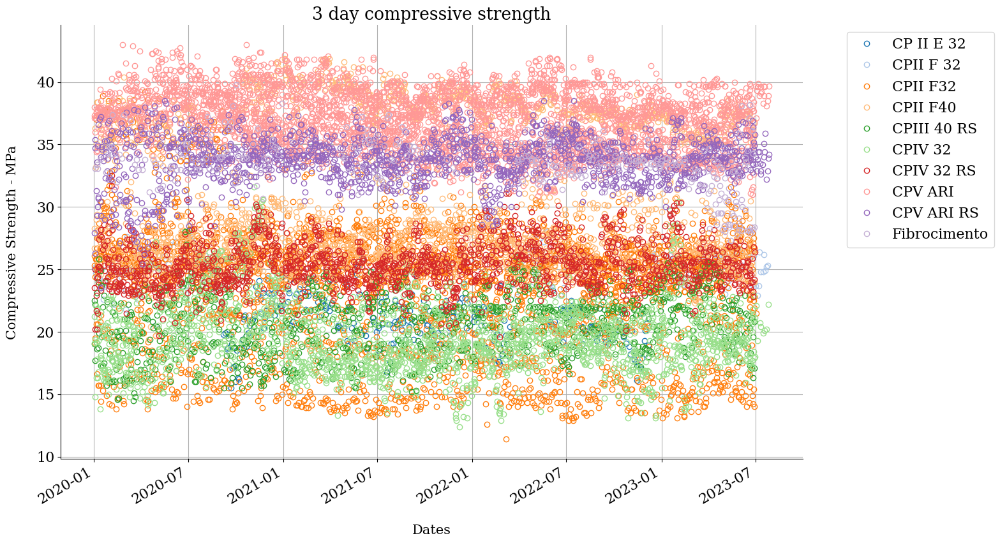

<IPython.core.display.Javascript object>

In [82]:
tmp = df[["Date", "CS3", "Cement_Type"]].dropna().copy()
tmp = tmp[(tmp["Date"].dt.year != 1900) & (tmp["Date"].dt.year > 2012)].reset_index(
    drop=True
)
tmp = tmp.set_index("Date")

fig, ax = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(15, 10))

# Iterate through cement types and plot with unique colors and labels
colors = plt.cm.get_cmap("tab20").colors  # Choose a colormap with enough colors
labels = []  # Empty list to store cement type labels for legend
for i, (cement_type, group_data) in enumerate(tmp.groupby("Cement_Type")):
    labels.append(cement_type)  # Add cement type to labels list
    group_data.plot(
        ax=ax,
        marker="o",
        linestyle="",
        color=colors[i],
        label=cement_type,
        markerfacecolor="None",
    )

ax.grid(which="both")
ax.legend(
    # title="1 day compressive strength",
    loc="upper left",
    bbox_to_anchor=(1.05, 1),
    labels=labels,
)  # Update legend with labels list
ax.set_xlabel("Dates", labelpad=20, fontsize=15)
ax.set_ylabel("Compressive Strength - MPa", labelpad=20, fontsize=15)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.set_title("3 day compressive strength")

plt.show()

#### 7 Days

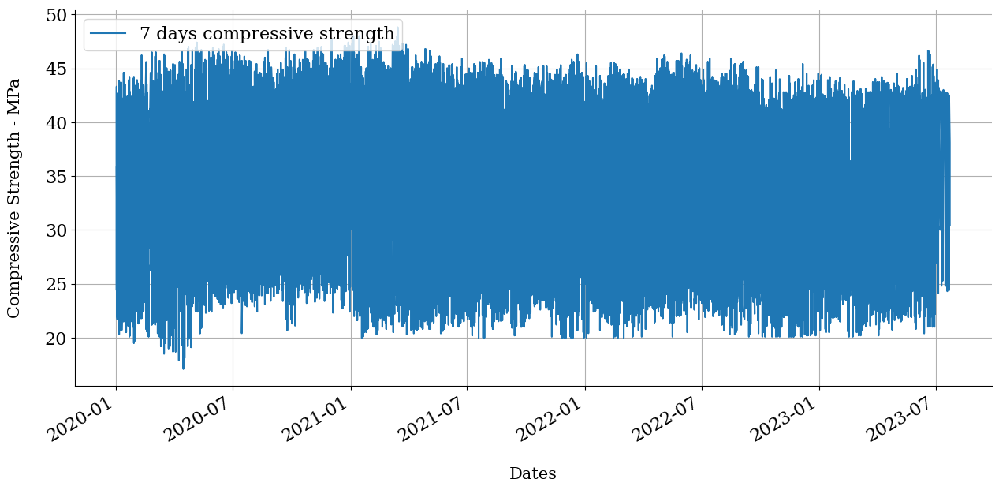

<IPython.core.display.Javascript object>

In [83]:
tmp = df[["Date", "CS7"]].dropna().copy()
tmp = tmp[tmp["CS7"] != 0].reset_index(drop=True)
tmp = tmp[tmp["Date"].dt.year != 1900].reset_index(drop=True)
tmp = tmp.set_index("Date")

fig, ax = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(15, 7))
tmp.plot(ax=ax)
ax.grid(which="both")
ax.legend(["7 days compressive strength"], loc="upper left")
ax.set_xlabel("Dates", labelpad=20, fontsize=15)
ax.set_ylabel("Compressive Strength - MPa", labelpad=20, fontsize=15)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

plt.show()

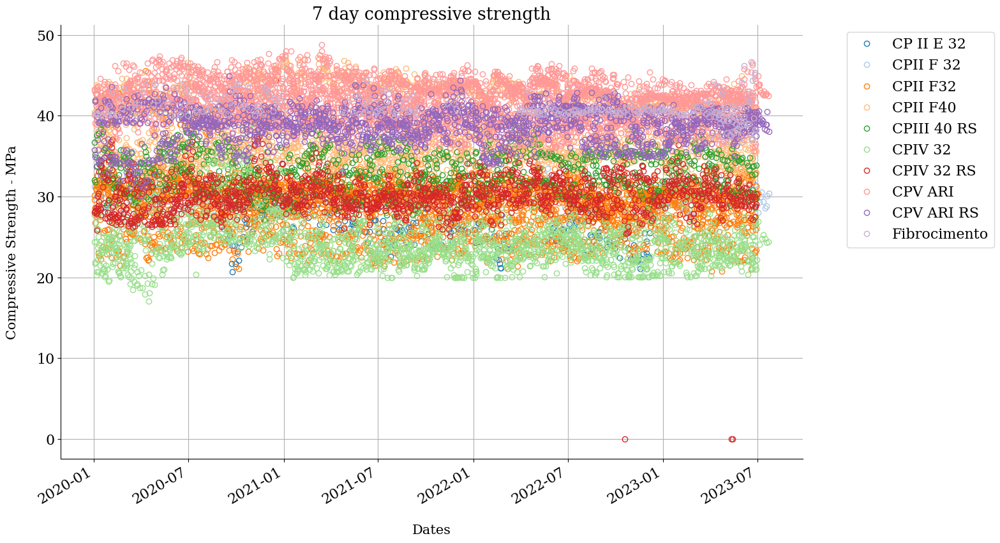

<IPython.core.display.Javascript object>

In [84]:
tmp = df[["Date", "CS7", "Cement_Type"]].dropna().copy()
tmp = tmp[(tmp["Date"].dt.year != 1900) & (tmp["Date"].dt.year > 2012)].reset_index(drop=True)
tmp = tmp.set_index("Date")

fig, ax = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(15, 10))

# Iterate through cement types and plot with unique colors and labels
colors = plt.cm.get_cmap("tab20").colors  # Choose a colormap with enough colors
labels = []  # Empty list to store cement type labels for legend
for i, (cement_type, group_data) in enumerate(tmp.groupby("Cement_Type")):
    labels.append(cement_type)  # Add cement type to labels list
    group_data.plot(ax=ax, marker="o", linestyle="", color=colors[i], label=cement_type, markerfacecolor="None",)

ax.grid(which="both")
ax.legend(
    # title="1 day compressive strength",
    loc="upper left",
    bbox_to_anchor=(1.05, 1),
    labels=labels,
)  # Update legend with labels list
ax.set_xlabel("Dates", labelpad=20, fontsize=15)
ax.set_ylabel("Compressive Strength - MPa", labelpad=20, fontsize=15)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.set_title("7 day compressive strength")

plt.show()


#### 28 Days

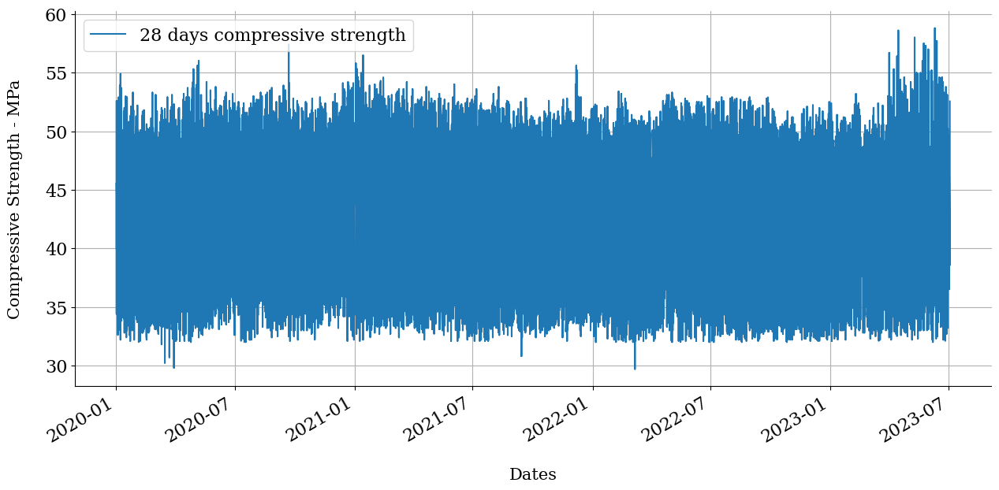

<IPython.core.display.Javascript object>

In [85]:
tmp = df[["Date", "CS28"]].dropna().copy()
tmp = tmp[tmp["CS28"] != 0].reset_index(drop=True)
tmp = tmp[tmp["Date"].dt.year != 1900].reset_index(drop=True)
tmp = tmp.set_index("Date")

fig, ax = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(15, 7))
tmp.plot(ax=ax)
ax.grid(which="both")
ax.legend(["28 days compressive strength"], loc="upper left")
ax.set_xlabel("Dates", labelpad=20, fontsize=15)
ax.set_ylabel("Compressive Strength - MPa", labelpad=20, fontsize=15)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

plt.show()

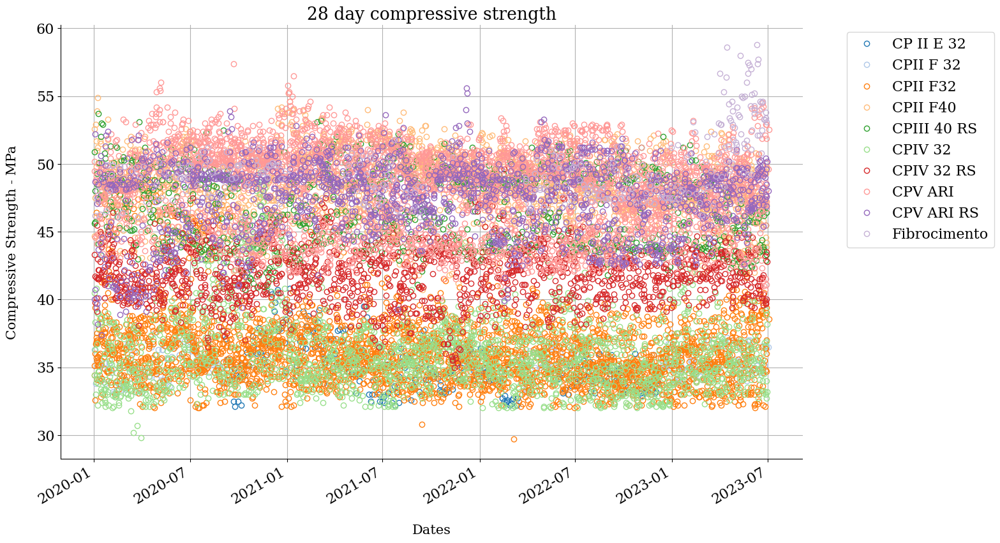

<IPython.core.display.Javascript object>

In [86]:
tmp = df[["Date", "CS28", "Cement_Type"]].dropna().copy()
tmp = tmp[tmp["CS28"] != 0].reset_index(drop=True)
tmp = tmp[(tmp["Date"].dt.year != 1900) & (tmp["Date"].dt.year > 2012)].reset_index(drop=True)
tmp = tmp.set_index("Date")

fig, ax = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(15, 10))

# Iterate through cement types and plot with unique colors and labels
colors = plt.cm.get_cmap("tab20").colors  # Choose a colormap with enough colors
labels = []  # Empty list to store cement type labels for legend
for i, (cement_type, group_data) in enumerate(tmp.groupby("Cement_Type")):
    labels.append(cement_type)  # Add cement type to labels list
    group_data.plot(ax=ax, marker="o", linestyle="", color=colors[i], label=cement_type, markerfacecolor="None")

ax.grid(which="both")
ax.legend(
    # title="1 day compressive strength",
    loc="upper left",
    bbox_to_anchor=(1.05, 1),
    labels=labels,
)  # Update legend with labels list
ax.set_xlabel("Dates", labelpad=20, fontsize=15)
ax.set_ylabel("Compressive Strength - MPa", labelpad=20, fontsize=15)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.set_title("28 day compressive strength")

plt.show()
